#### Ski Resort Project University of Zürich 2020
## The test notebook for case4_Les Diablerets_2000_ 1200-3200 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


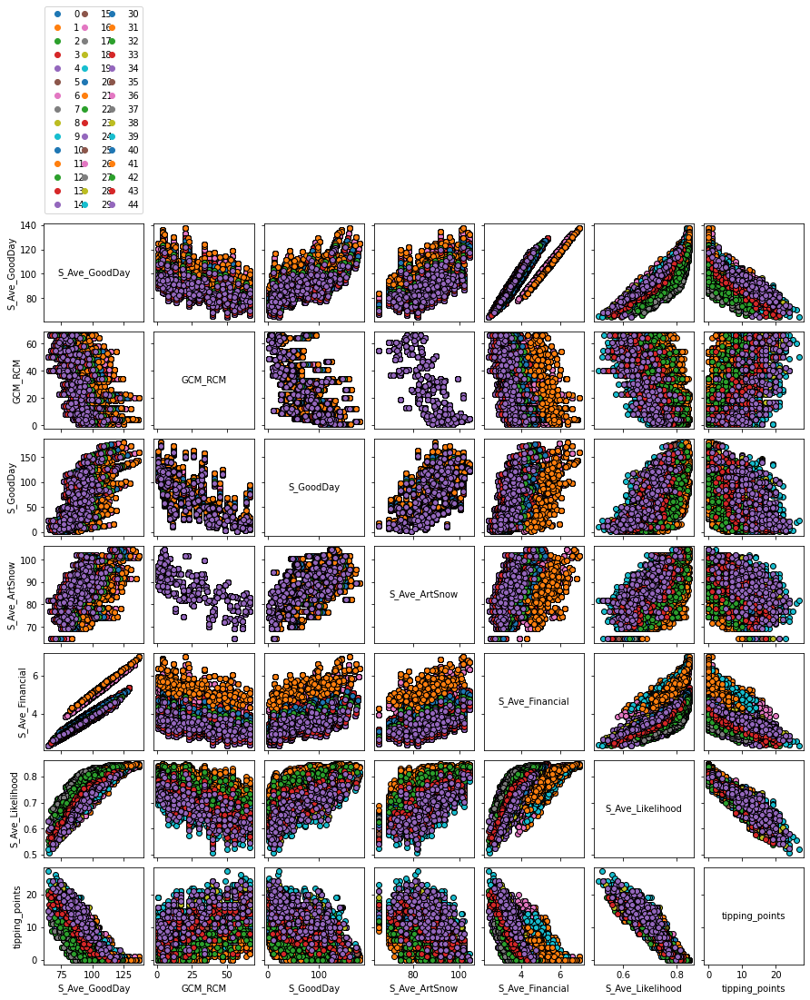

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [9]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [10]:
print(outcomes2)

{'S_Ave_GoodDay': array([111.02350154, 106.80295609,  92.46355932, ..., 105.46790315,
        77.06567918,  68.05914013]), 'S_GoodDay': array([[129.02318182, 159.44490909, 118.36518182, ..., 133.98527273,
         34.13354545,  84.17386364],
       [128.66163636, 114.11186364, 138.07909091, ...,  85.92859091,
         97.40372727, 101.36054545],
       [113.80754545, 161.77854545, 139.20713636, ...,  25.242     ,
         23.36895455,  26.51304545],
       ...,
       [120.07667857, 157.81778571, 120.52607143, ..., 125.31335714,
         29.20721429,  84.78596429],
       [ 55.45667857,  81.21532143,  48.60103571, ...,  35.62992857,
         99.61696429,  15.38121429],
       [130.80825   ,  71.27007143, 114.47067857, ...,  27.38875   ,
         38.46117857,  23.94332143]]), 'S_Ave_ArtSnow': array([76.81254237, 99.07372881, 78.41652542, ..., 78.03474576,
       71.36737288, 81.82457627]), 'S_Ave_Financial': array([5.47008475, 5.27144068, 4.54338983, ..., 4.09169492, 2.95830508,
       

In [11]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [12]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


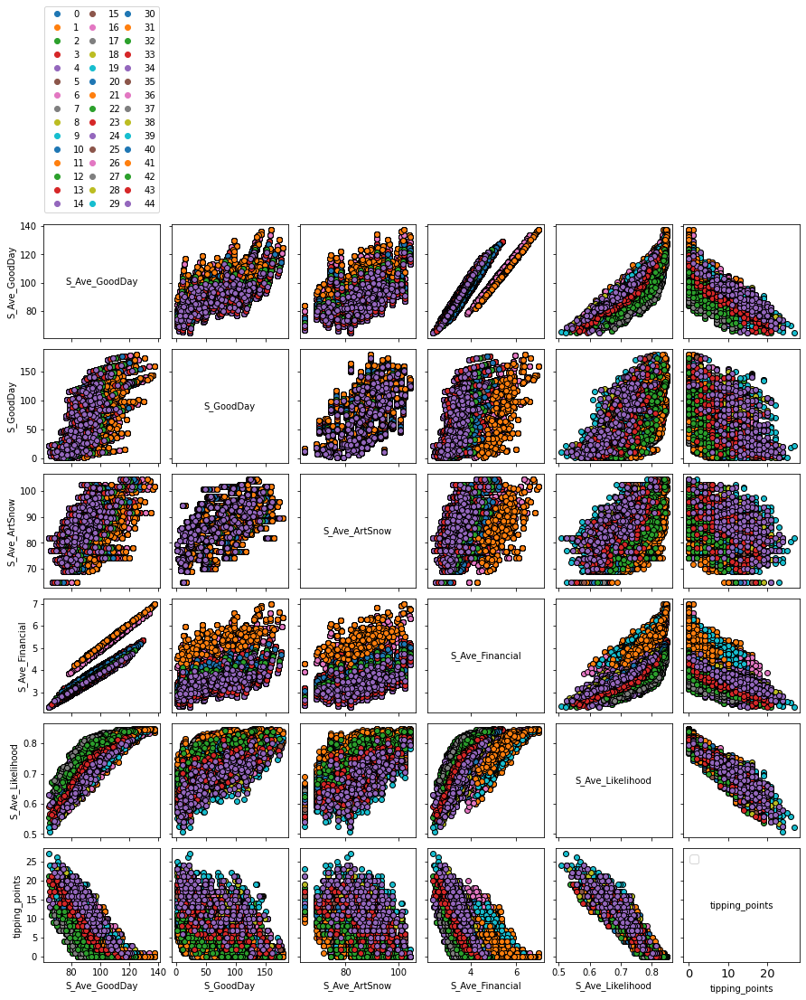

In [13]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [14]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [15]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [16]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.442734,1035.634201,5.267948,-1.827199,1.313459,0.066028,2.0,220.0,90.0,0,0,UZHModel,111.023502,13,129.023182,159.444909,118.365182,91.811273,149.430773,156.244136,149.107545,157.892636,145.639682,132.382273,117.030455,156.330864,143.430273,114.828864,118.181864,131.247682,130.378136,130.818000,126.435818,123.845000,...,57.342864,115.482864,74.951727,127.293000,95.917091,93.012000,44.687273,108.227500,129.079045,48.150500,134.258591,6.462045,141.785318,47.894182,47.884227,80.220227,130.086182,38.862091,141.030409,68.910773,79.259682,86.340955,109.459045,58.611955,15.841318,129.020864,141.541909,133.985273,34.133545,84.173864,76.812542,5.470085,0.782869,2.0
1,1.486545,1018.548771,5.276301,-1.189430,1.517765,0.638193,1.0,220.0,90.0,1,0,UZHModel,106.802956,7,128.661636,114.111864,138.079091,129.469909,134.227364,159.512545,145.141591,120.660227,135.786818,117.625591,138.022591,124.258136,140.279182,107.806727,102.725909,99.512000,145.375955,127.129227,57.834909,99.189273,...,117.206000,137.331273,41.339545,115.578545,119.082136,109.578045,92.258409,130.142955,66.440864,90.617000,129.512000,117.188182,69.997318,78.781545,92.289909,76.853682,108.485091,116.848455,20.578045,115.790091,109.460136,141.436500,72.652273,114.444818,132.010318,70.255409,120.483727,85.928591,97.403727,101.360545,99.073729,5.271441,0.789855,1.0
2,1.531294,965.708229,5.456262,-1.514389,1.881991,0.925296,3.0,220.0,90.0,2,0,UZHModel,92.463559,65,113.807545,161.778545,139.207136,123.794273,127.114000,150.855318,134.417000,119.825591,131.532318,152.182727,118.310955,151.474182,136.448955,119.300182,136.170045,145.747091,117.004864,129.125773,97.884864,141.414273,...,118.357227,33.519864,9.301636,75.174182,65.397364,26.562500,123.351182,80.780227,28.799409,10.892773,38.699455,22.691091,84.843818,105.264318,72.750364,101.223455,56.266409,65.040455,15.138727,11.426091,14.719636,13.736182,30.476591,72.311273,5.836682,63.564545,26.382045,25.242000,23.368955,26.513045,78.416525,4.543390,0.691250,10.0
3,1.410668,1057.360359,4.633438,-1.832953,2.959759,0.413495,3.0,220.0,90.0,3,0,UZHModel,85.435967,49,124.678364,143.435364,144.970773,115.487409,124.758045,156.783455,150.345364,148.250864,104.333773,102.948045,124.548182,129.944409,119.558500,147.024727,97.673318,114.933000,113.258591,111.865409,156.356091,119.248500,...,103.858091,106.979409,14.089909,34.968818,30.003364,23.128136,82.904955,87.491818,33.913136,37.896182,70.912955,19.430364,67.890273,42.005500,83.679136,67.161864,82.960182,42.351500,12.798045,9.830682,21.423545,3.937500,11.411227,81.393682,17.722818,21.940864,15.298864,25.570591,8.279136,3.741955,74.033729,4.181102,0.655477,12.0
4,1.482666,918.540146,4.766977,-1.918828,1.579686,0.545454,2.0,220.0,90.0,4,0,UZHModel,93.250740,25,99.775182,136.602273,56.394091,89.138136,78.886227,128.787136,148.280045,122.915636,140.065091,107.562500,98.611273,146.420045,160.805773,115.701182,105.873364,132.452364,103.292000,144.177136,98.952591,55.249045,...,99.716182,87.723182,70.366591,57.102727,22.429955,121.750545,103.224000,92.431364,83.555545,91.839636,14.171318,12.208545,87.107136,128.807182,23.758318,82.519182,126.408591,54.592318,95.356045,28.915045,68.026818,63.514864,63.680000,82.490273,54.412909,85.811091,58.279773,107.707409,56.514636,95.453273,80.120847,4.568475,0.733596,8.0


In [17]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [18]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [19]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [20]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [21]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [22]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [23]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [24]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [25]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_26_8
Money_sc_26_8
ArtSnowPossibility_sc_26_8
isOverSnow_sc_26_8


In [26]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [27]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000


In [28]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [29]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [30]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[76.96104828]
[87.56330903]
[108.8545959]
[125.84680143]
[137.15808333]
(118, 1)
[2.949]
[3.57]
[4.53]
[5.27]
[6.191]
(118, 1)
[85.178]
[90.0125]
[98.16]
[105.55]
[111.659]
(118, 1)
[89.98466255]
[100.]
[100.]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [31]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

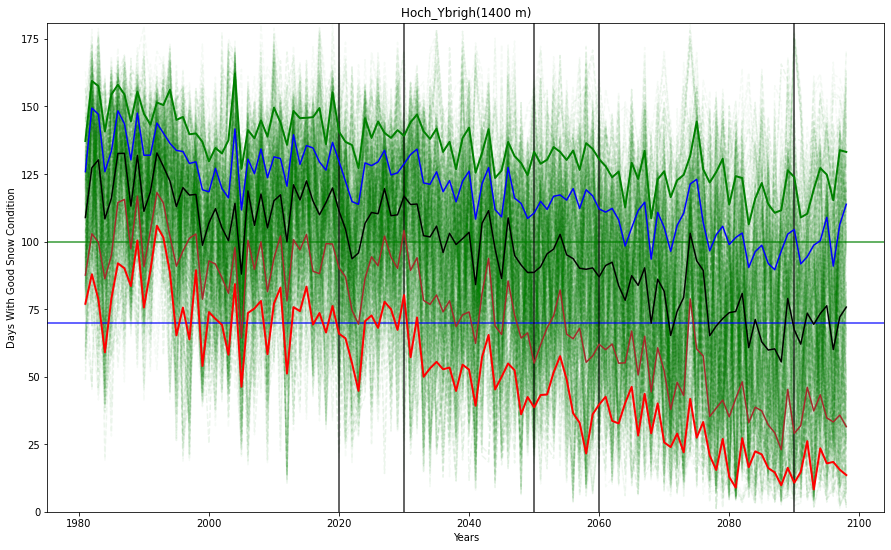

In [32]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

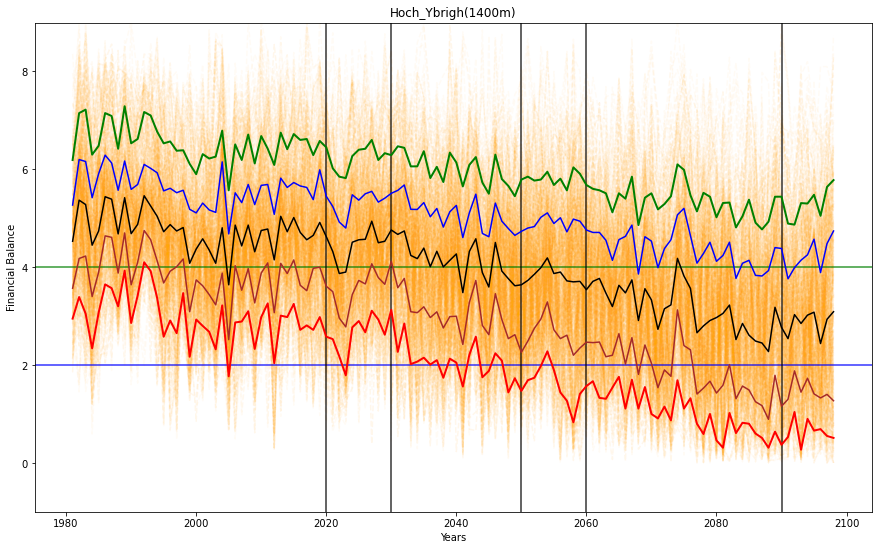

In [33]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

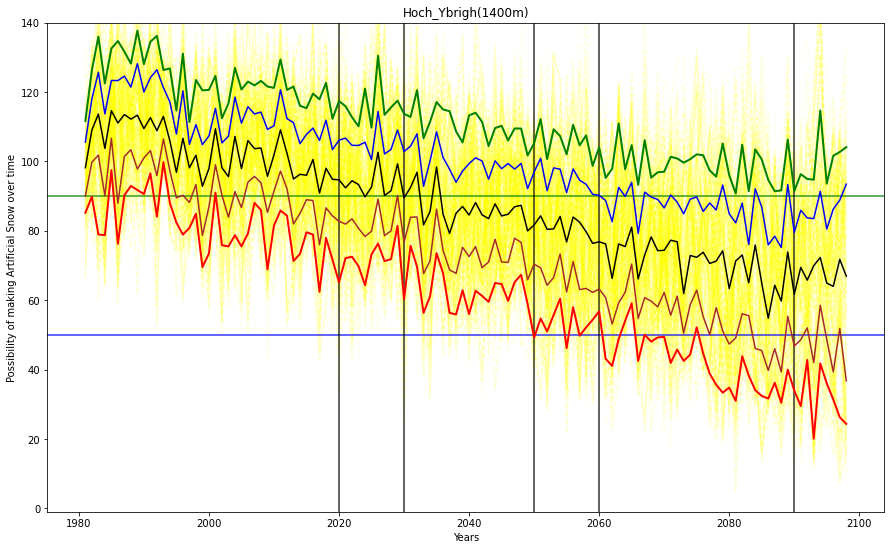

In [34]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

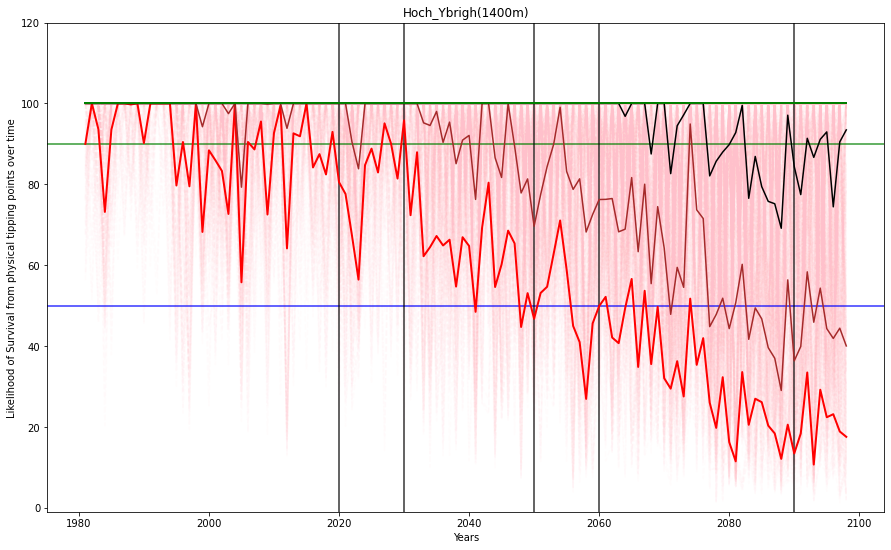

In [35]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [36]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 80
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 940 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.819047619047619, mass: 0.058333333333333334, coverage: 0.4574468085106383, density: 0.819047619047619 restricted_dimensions: 6


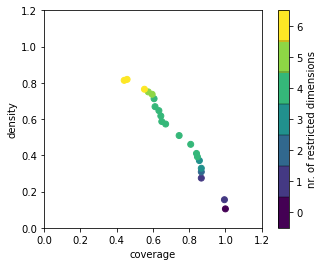

<Figure size 432x288 with 0 Axes>

In [37]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage     0.553191
density      0.764706
id                 18
mass        0.0755556
mean         0.764706
res_dim             6
Name: 18, dtype: object

                                       box 18                                \
                                          min                           max   
X3iPot                                900.654                        1087.7   
xRCP                                      2.5                             3   
x1SnowThershold  {290.0, 300.0, 270.0, 280.0}  {290.0, 300.0, 270.0, 280.0}   
Xfactor1                              1.07466                       3.48055   
X6tempArt                            -1.94585                      -1.00217   
X5temp                                4.53041                       5.68252   

                                                               
                                                    qp values  
X3iPot                            [-1.0, 0.20068481428559584]  
xRCP              

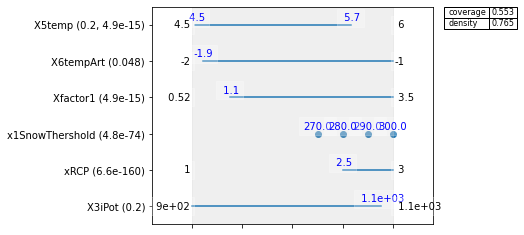

In [38]:
# Saeed : explore the inspect effect
box1.inspect(18)
box1.inspect(18, style='graph')
plt.show()

x1SnowThershold [290.0, 300.0, 270.0, 280.0, 260.0, 200.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


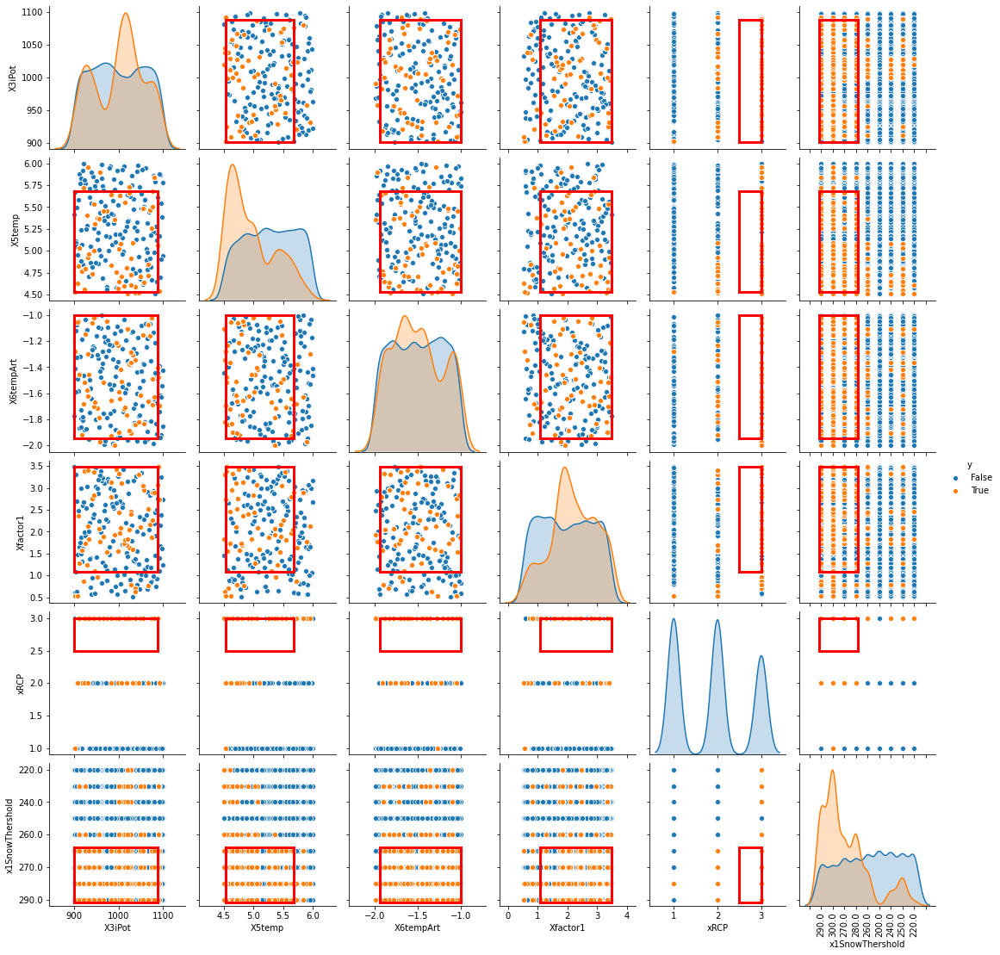

In [39]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(18)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [ ]:
box2 = prim_alg.find_box()

In [ ]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

In [ ]:
# Saeed : explore the inspect effect
box2.inspect(15)
box2.inspect(15, style='graph')
plt.show()

In [ ]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(15)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [40]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 80
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1800 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9696969696969697, mass: 0.165, coverage: 0.8, density: 0.9696969696969697 restricted_dimensions: 4


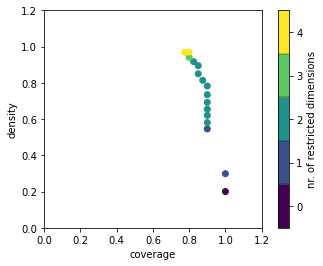

In [41]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.85
density     0.85
id            10
mass         0.2
mean        0.85
res_dim        2
Name: 10, dtype: object

             box 10                                           
                min       max                        qp values
X6tempArt -1.999202 -1.443962  [-1.0, 5.6806489580608604e-167]
xRCP       2.500000  3.000000                      [0.0, -1.0]



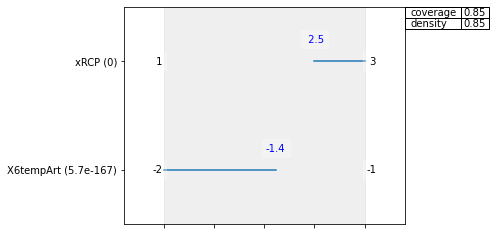

In [42]:
# Saeed : explore the inspect effect
box3.inspect(10)
box3.inspect(10, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


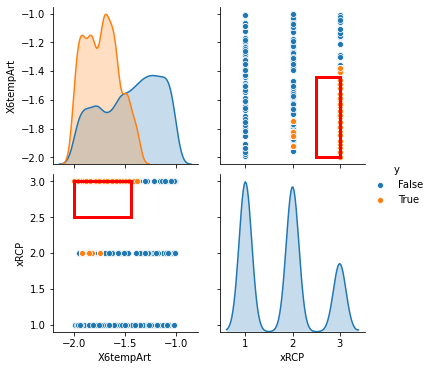

In [43]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(10)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [44]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.7
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2008 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[M

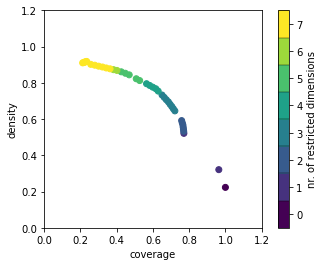

In [45]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage    0.582171
density     0.785618
id                20
mass        0.165333
mean        0.785618
res_dim            4
Name: 20, dtype: object

                                                      box 20  \
                                                         min   
xRCP                                                     2.5   
policy     {0, 2, 3, 6, 7, 9, 11, 13, 15, 17, 18, 19, 21,...   
xGoodDays                          {100.0, 70.0, 80.0, 90.0}   
Xfactor1                                            0.636017   

                                                              \
                                                         max   
xRCP                                                       3   
policy     {0, 2, 3, 6, 7, 9, 11, 13, 15, 17, 18, 19, 21,...   
xGoodDays                          {100.0, 70.0, 80.0, 90.0}   
Xfactor1                                             3.48055   

                                           
                                qp 

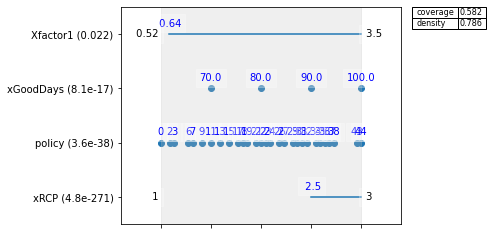

In [46]:
# Saeed : explore the inspect effect
box4.inspect(20)
box4.inspect(20, style='graph')
plt.show()

xGoodDays [100.0, 70.0, 80.0, 90.0, 60.0]
policy [0, 2, 3, 6, 7, 9, 11, 13, 15, 17, 18, 19, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 1, 33, 4, 5, 8, 41, 10, 12, 14, 16, 20, 25]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


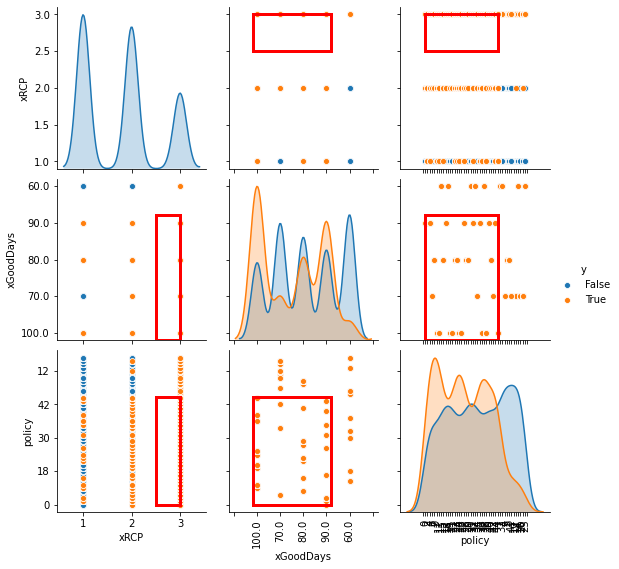

In [47]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(15)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [48]:
x = experiments
y = outcomes['tipping_points'] < 10
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 6769 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.21333333333333335, coverage: 0.28364603338750183, density: 1.0 restricted_dimensions: 5


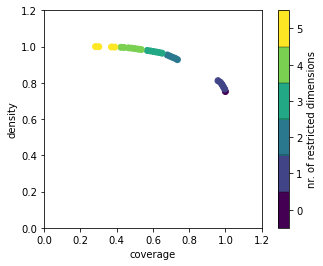

In [49]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.483528
density     0.991217
id                20
mass        0.366889
mean        0.991217
res_dim            4
Name: 20, dtype: object

                                                      box 20  \
                                                         min   
xRCP                                                       1   
policy     {0, 1, 4, 5, 6, 7, 8, 10, 12, 13, 14, 16, 18, ...   
xGoodDays                           {70.0, 80.0, 90.0, 60.0}   
X5temp                                               4.57481   

                                                              \
                                                         max   
xRCP                                                     2.5   
policy     {0, 1, 4, 5, 6, 7, 8, 10, 12, 13, 14, 16, 18, ...   
xGoodDays                           {70.0, 80.0, 90.0, 60.0}   
X5temp                                               5.99283   

                                           
                                qp 

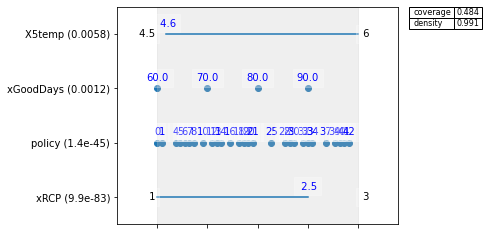

In [50]:
# Saeed : explore the inspect effect
box5.inspect(20)
box5.inspect(20, style='graph')
plt.show()

xGoodDays [70.0, 80.0, 90.0, 60.0, 100.0]
policy [0, 1, 4, 5, 6, 7, 8, 10, 12, 13, 14, 16, 18, 19, 20, 21, 25, 28, 29, 30, 32, 33, 34, 37, 39, 40, 41, 42, 2, 3, 35, 36, 38, 9, 11, 43, 44, 15, 17, 22, 23, 24, 26, 27, 31]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


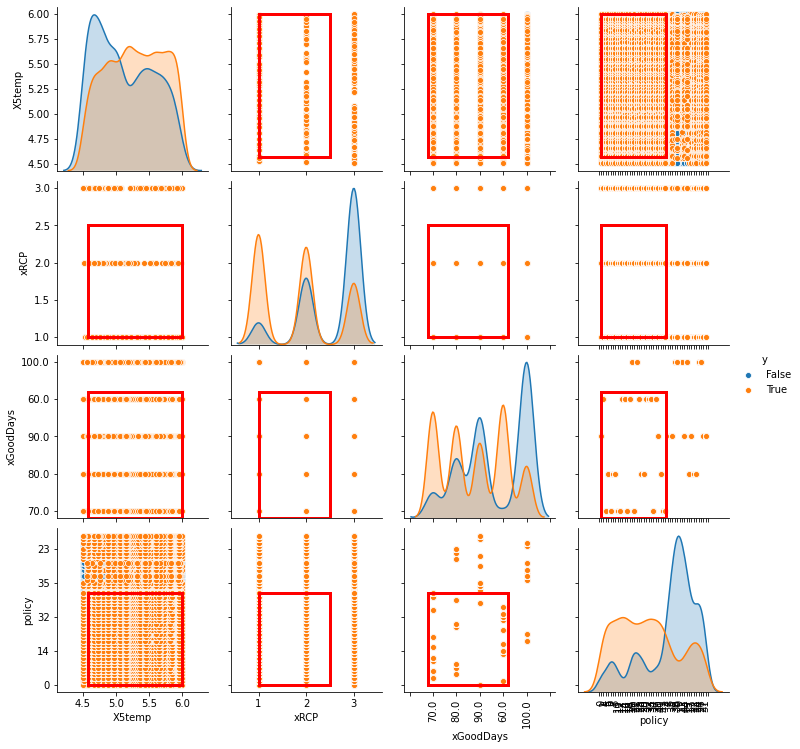

In [51]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(20)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [52]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [53]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [54]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


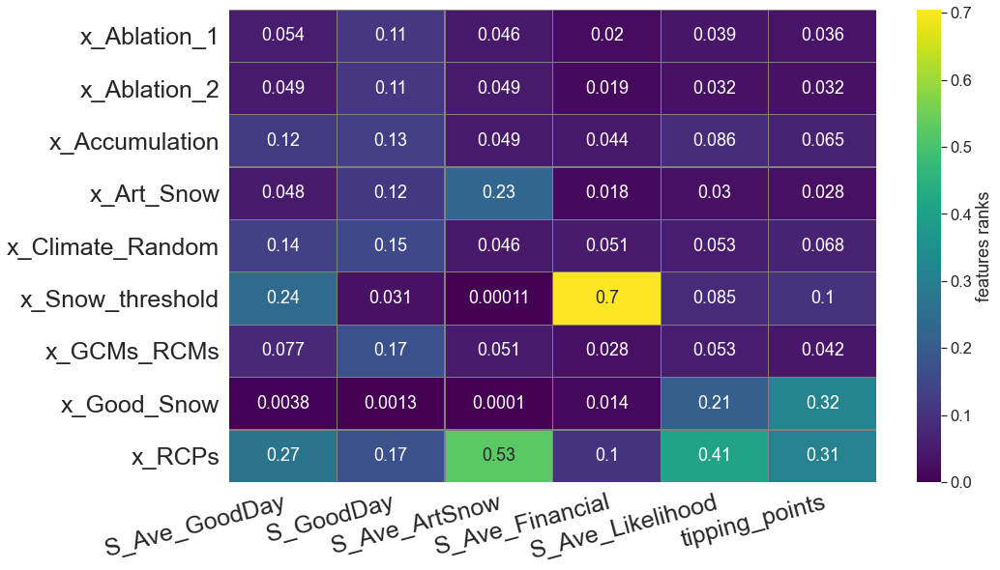

In [55]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


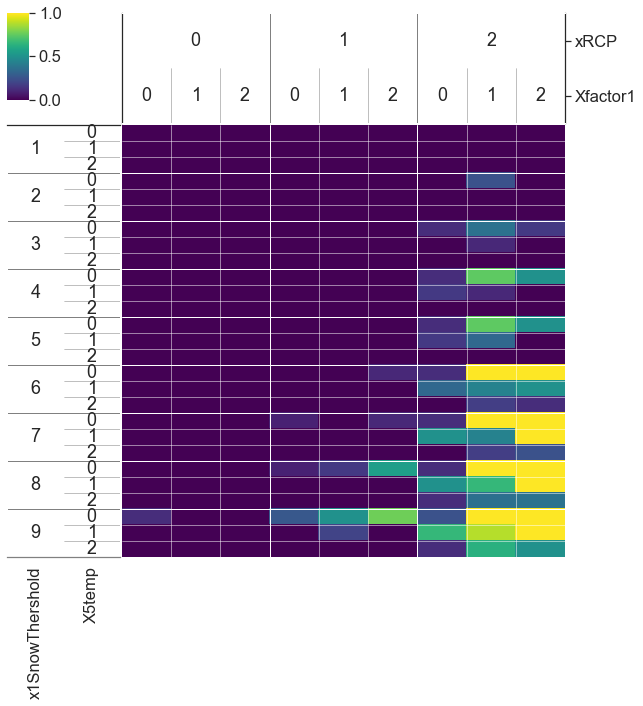

In [56]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 80
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


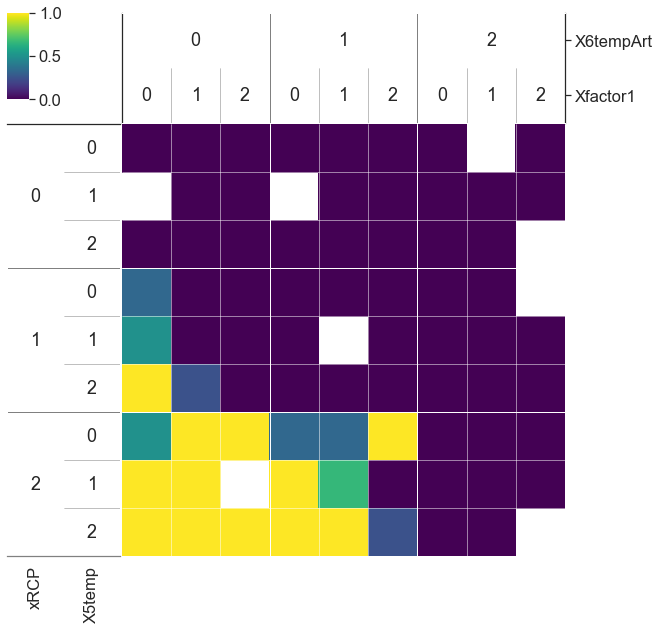

In [57]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 80
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


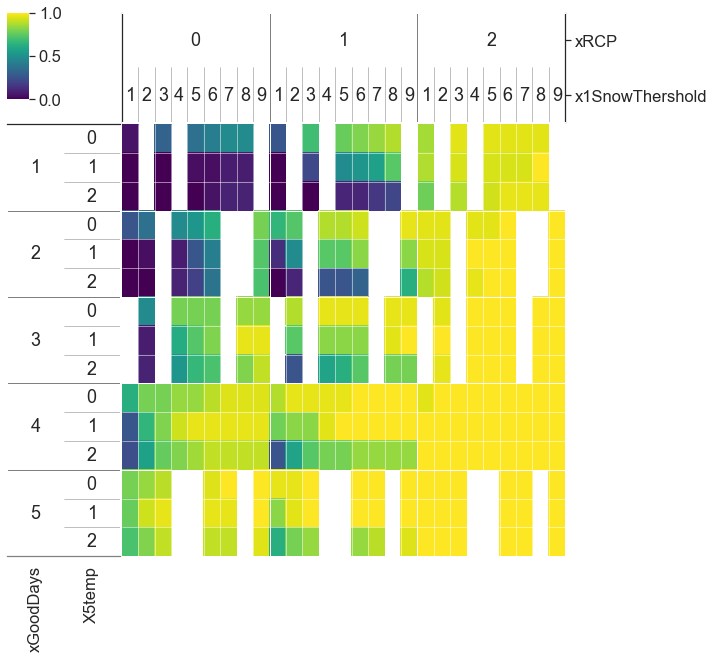

In [58]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.8
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

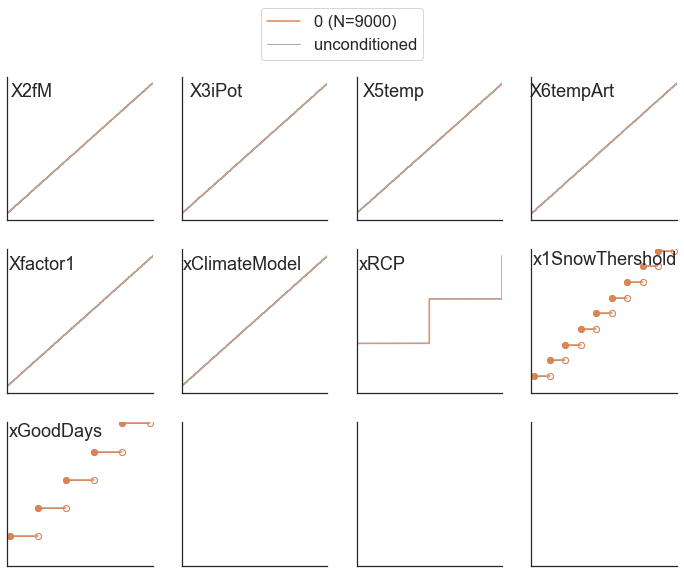

In [59]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

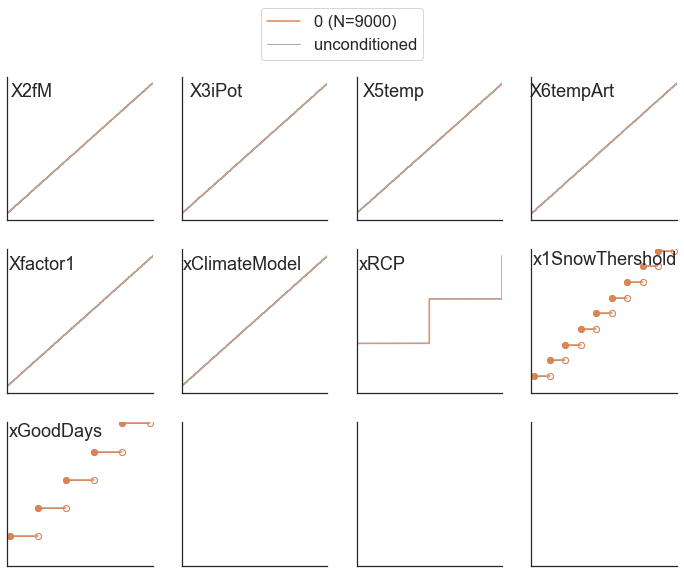

In [60]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

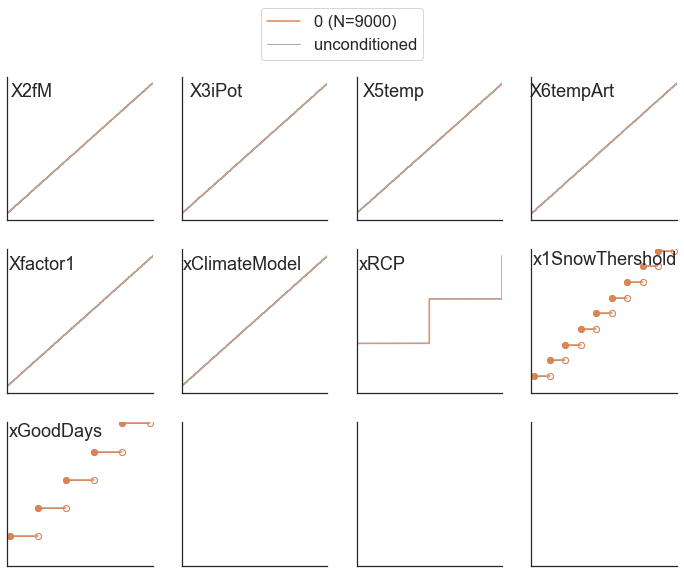

In [61]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

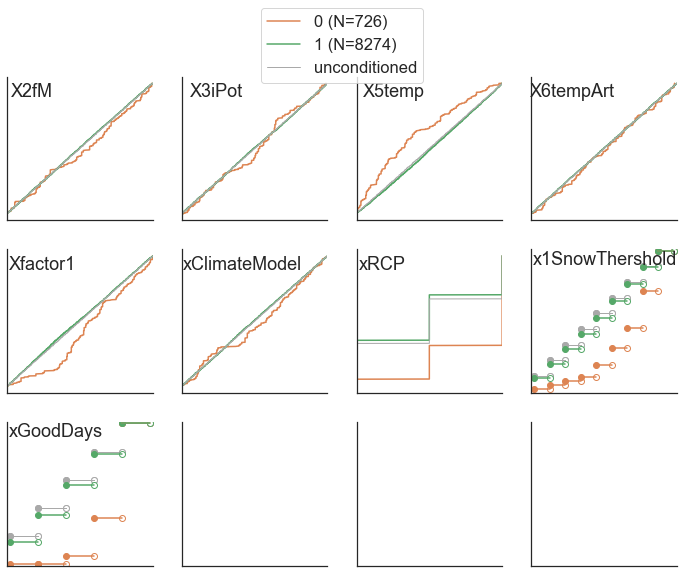

In [62]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

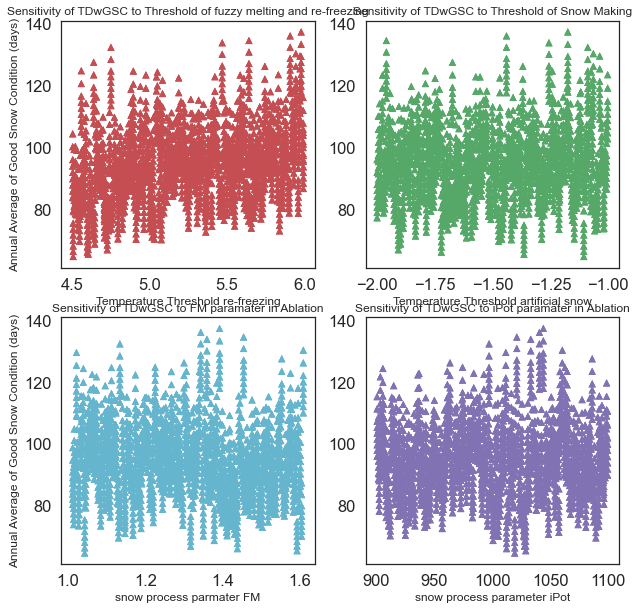

In [63]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

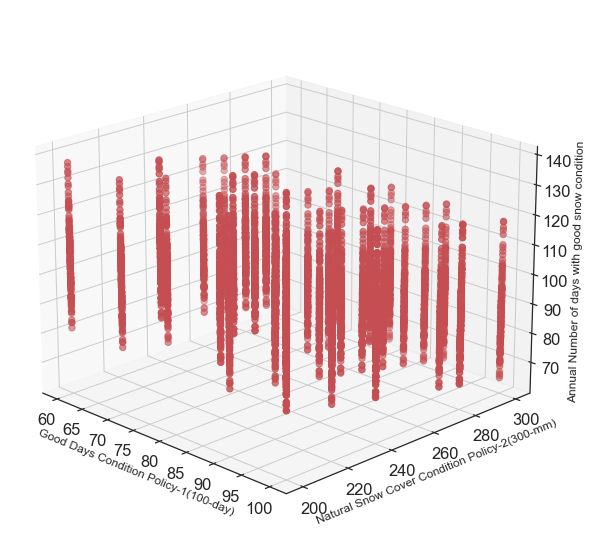

In [64]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [65]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.442734,1035.634201,5.267948,-1.827199,1.313459,0.066028,2.0,220.0,90.0,0,0,UZHModel,111.023502,13,129.023182,159.444909,118.365182,91.811273,149.430773,156.244136,149.107545,157.892636,145.639682,132.382273,117.030455,156.330864,143.430273,114.828864,118.181864,131.247682,130.378136,130.818000,126.435818,123.845000,...,57.342864,115.482864,74.951727,127.293000,95.917091,93.012000,44.687273,108.227500,129.079045,48.150500,134.258591,6.462045,141.785318,47.894182,47.884227,80.220227,130.086182,38.862091,141.030409,68.910773,79.259682,86.340955,109.459045,58.611955,15.841318,129.020864,141.541909,133.985273,34.133545,84.173864,76.812542,5.470085,0.782869,2.0
1,1.486545,1018.548771,5.276301,-1.189430,1.517765,0.638193,1.0,220.0,90.0,1,0,UZHModel,106.802956,7,128.661636,114.111864,138.079091,129.469909,134.227364,159.512545,145.141591,120.660227,135.786818,117.625591,138.022591,124.258136,140.279182,107.806727,102.725909,99.512000,145.375955,127.129227,57.834909,99.189273,...,117.206000,137.331273,41.339545,115.578545,119.082136,109.578045,92.258409,130.142955,66.440864,90.617000,129.512000,117.188182,69.997318,78.781545,92.289909,76.853682,108.485091,116.848455,20.578045,115.790091,109.460136,141.436500,72.652273,114.444818,132.010318,70.255409,120.483727,85.928591,97.403727,101.360545,99.073729,5.271441,0.789855,1.0
2,1.531294,965.708229,5.456262,-1.514389,1.881991,0.925296,3.0,220.0,90.0,2,0,UZHModel,92.463559,65,113.807545,161.778545,139.207136,123.794273,127.114000,150.855318,134.417000,119.825591,131.532318,152.182727,118.310955,151.474182,136.448955,119.300182,136.170045,145.747091,117.004864,129.125773,97.884864,141.414273,...,118.357227,33.519864,9.301636,75.174182,65.397364,26.562500,123.351182,80.780227,28.799409,10.892773,38.699455,22.691091,84.843818,105.264318,72.750364,101.223455,56.266409,65.040455,15.138727,11.426091,14.719636,13.736182,30.476591,72.311273,5.836682,63.564545,26.382045,25.242000,23.368955,26.513045,78.416525,4.543390,0.691250,10.0
3,1.410668,1057.360359,4.633438,-1.832953,2.959759,0.413495,3.0,220.0,90.0,3,0,UZHModel,85.435967,49,124.678364,143.435364,144.970773,115.487409,124.758045,156.783455,150.345364,148.250864,104.333773,102.948045,124.548182,129.944409,119.558500,147.024727,97.673318,114.933000,113.258591,111.865409,156.356091,119.248500,...,103.858091,106.979409,14.089909,34.968818,30.003364,23.128136,82.904955,87.491818,33.913136,37.896182,70.912955,19.430364,67.890273,42.005500,83.679136,67.161864,82.960182,42.351500,12.798045,9.830682,21.423545,3.937500,11.411227,81.393682,17.722818,21.940864,15.298864,25.570591,8.279136,3.741955,74.033729,4.181102,0.655477,12.0
4,1.482666,918.540146,4.766977,-1.918828,1.579686,0.545454,2.0,220.0,90.0,4,0,UZHModel,93.250740,25,99.775182,136.602273,56.394091,89.138136,78.886227,128.787136,148.280045,122.915636,140.065091,107.562500,98.611273,146.420045,160.805773,115.701182,105.873364,132.452364,103.292000,144.177136,98.952591,55.249045,...,99.716182,87.723182,70.366591,57.102727,22.429955,121.750545,103.224000,92.431364,83.555545,91.839636,14.171318,12.208545,87.107136,128.807182,23.758318,82.519182,126.408591,54.592318,95.356045,28.915045,68.026818,63.514864,63.680000,82.490273,54.412909,85.811091,58.279773,107.707409,56.514636,95.453273,80.120847,4.568475,0.733596,8.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [66]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.027446,933.235551,4.965789,-1.453969,1.839636,0.965367,3.0,280.0,100.0,195,44,UZHModel,77.071720,66,72.293179,131.805929,151.661893,84.756429,107.904786,111.954357,58.164607,150.595964,91.541964,92.219821,91.595964,119.629429,126.175964,150.722214,117.456500,105.266107,119.405036,124.812250,100.504321,113.720643,...,67.316536,118.054143,41.315607,94.019750,13.614286,47.988500,62.829107,68.708250,10.368500,10.214750,51.866393,104.123464,28.499286,72.609214,25.195821,5.274321,88.291643,11.294821,15.318179,16.123250,30.155036,11.074250,17.709286,61.673286,51.272143,25.199179,7.087357,68.450286,28.273464,7.047643,80.853814,2.954068,0.600194,20.0
8996,1.318041,1027.651034,4.729265,-1.907281,0.799025,0.619490,3.0,280.0,100.0,196,44,UZHModel,69.921831,55,117.590071,80.506321,122.411571,135.660536,31.485250,114.102964,141.204357,94.368143,155.792929,99.190143,114.695536,118.249821,89.315250,99.155750,75.728429,105.514357,110.802321,122.626179,115.542286,121.794393,...,46.802464,64.562643,22.562893,27.012964,12.823179,15.444036,11.967643,12.297321,34.133250,73.897679,17.806786,6.937107,4.719964,108.613036,16.052429,5.883179,38.972571,69.982429,5.107893,9.085714,12.138143,24.766500,4.616071,5.227571,7.615286,8.612643,13.466964,13.006393,23.348429,12.135571,64.772797,2.670932,0.540917,21.0
8997,1.174786,935.837937,5.609377,-1.748463,1.372963,0.084908,2.0,280.0,100.0,197,44,UZHModel,105.467903,13,120.076679,157.817786,120.526071,90.888893,142.998000,148.071679,147.359786,146.254643,144.156607,124.953357,104.122143,149.625786,136.158893,100.844286,108.497286,122.081500,106.965321,121.604607,127.152857,114.538107,...,51.308429,106.590000,79.366429,119.192929,100.785643,104.200714,38.903821,97.945607,141.843643,43.313893,131.264500,7.128929,138.808607,74.599357,40.185500,78.711214,129.631429,34.344714,133.738250,57.636714,68.293464,102.425143,94.460036,63.465179,24.126143,119.390500,134.748500,125.313357,29.207214,84.785964,78.034746,4.091695,0.758385,5.0
8998,1.494826,1024.169291,5.657563,-1.885777,2.043248,0.004405,3.0,280.0,100.0,198,44,UZHModel,77.065679,37,55.456679,81.215321,48.601036,129.153607,121.571107,115.311429,126.172571,102.516929,102.126036,87.502714,106.469036,129.726679,138.053214,127.225250,137.001000,23.853357,40.741929,136.473679,108.776929,128.023714,...,70.205214,95.940607,37.172536,60.828714,34.232464,54.627679,68.823071,51.243321,22.939964,15.221036,80.789000,33.683357,22.169464,16.684214,27.039607,20.582321,24.070036,15.715536,32.065750,10.126357,7.364000,30.248429,19.630643,26.067107,5.342321,50.957393,16.624286,35.629929,99.616964,15.381214,71.367373,2.958305,0.587936,18.0
8999,1.043288,1019.306829,4.509742,-1.105314,1.822448,0.451474,3.0,280.0,100.0,199,44,UZHModel,68.059140,50,130.808250,71.270071,114.470679,40.597429,62.266893,66.521214,103.054857,120.235464,135.468571,73.461679,66.901036,123.200929,129.303714,111.443750,128.648286,115.568464,84.728679,98.187321,44.466143,44.712107,...,29.543750,13.937964,59.691607,37.264500,13.169250,24.461964,14.381714,24.719179,36.819679,10.078357,78.309571,10.724607,11.446786,26.391107,14.650393,47.255607,7.204857,23.416643,29.702321,4.678107,5.684929,4.932464,49.619036,41.210393,28.204250,8.269357,47.539714,27.388750,38.461179,23.943321,81.824576,2.605169,0.542613,22.0


In [67]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [68]:
x_policy[1]

220.0

In [69]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,220.0,90.0,1,0,UZHModel,106.802956,7,128.661636,114.111864,138.079091,129.469909,134.227364,159.512545,145.141591,120.660227,135.786818,117.625591,138.022591,124.258136,140.279182,107.806727,102.725909,99.512000,145.375955,127.129227,57.834909,99.189273,...,117.206000,137.331273,41.339545,115.578545,119.082136,109.578045,92.258409,130.142955,66.440864,90.617000,129.512000,117.188182,69.997318,78.781545,92.289909,76.853682,108.485091,116.848455,20.578045,115.790091,109.460136,141.436500,72.652273,114.444818,132.010318,70.255409,120.483727,85.928591,97.403727,101.360545,99.073729,5.271441,0.789855,1.0
201,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,200.0,60.0,1,1,UZHModel,110.983614,7,130.109750,116.807100,143.752300,134.467400,139.285250,160.938600,148.344850,125.574150,140.765500,121.589550,140.478500,128.345200,144.280550,111.787400,105.658650,101.958450,148.574200,132.281850,63.618400,105.129900,...,120.251350,141.536850,45.473500,119.056500,121.893650,113.209450,96.461400,131.057250,70.719450,92.489650,133.804550,120.866300,76.965450,85.091650,95.741650,83.930000,111.692750,124.992550,22.635850,120.781400,113.175300,148.141350,77.187900,117.742650,134.896950,77.280950,121.932100,90.691550,101.288800,104.312250,99.073729,5.674492,0.826447,0.0
401,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,300.0,90.0,1,2,UZHModel,90.166335,7,123.150200,90.997433,112.965733,115.242667,113.183167,150.405600,135.087100,105.732800,120.393167,100.839433,127.226867,104.844433,120.169600,93.617867,90.569000,75.397700,134.125167,108.466433,42.412267,76.898433,...,103.664300,121.774933,30.315667,97.934533,108.346867,95.328700,69.719033,123.512767,49.133533,78.536500,106.676767,99.808000,51.331367,58.888133,74.464967,56.365800,92.925333,86.927100,15.090567,97.439567,95.711333,114.553233,54.331833,96.818200,120.452333,51.520633,114.280100,64.033167,79.284767,91.042367,99.073729,3.304915,0.734132,5.0
601,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,280.0,90.0,1,3,UZHModel,94.193884,7,124.779286,97.497250,118.911607,118.231393,117.941000,152.889107,137.622179,108.963000,124.454250,105.939750,129.801536,109.955679,125.288429,97.424750,93.990071,80.783250,136.510071,112.640607,45.441714,81.836536,...,107.774857,125.617500,32.481071,104.804000,111.358714,98.874429,74.698964,125.313143,52.643071,82.884036,113.010250,103.294286,54.997893,63.094429,78.262179,60.391929,96.852250,93.136179,16.168464,101.765821,98.727786,122.241500,58.212679,101.154536,123.181786,55.200679,116.123286,68.606964,84.430536,93.574679,99.073729,3.628390,0.748628,4.0
801,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,250.0,70.0,1,4,UZHModel,100.452595,7,126.697120,107.272040,128.042120,123.229840,126.121760,156.514640,141.075920,114.435600,129.681520,112.129720,133.805040,117.921080,132.483520,102.666120,98.753760,90.283360,140.562760,119.728920,50.894720,90.108320,...,112.612120,131.751240,36.378800,110.826520,115.154120,104.233480,83.662840,128.470720,58.960240,87.527480,121.166680,109.481600,61.597640,70.432760,84.946960,67.638960,102.900360,104.312520,18.108680,108.456800,103.777840,132.481200,65.198200,108.299600,127.364840,61.824760,118.475640,76.757760,91.392880,97.270240,99.073729,4.142712,0.806704,0.0
1001,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.63819

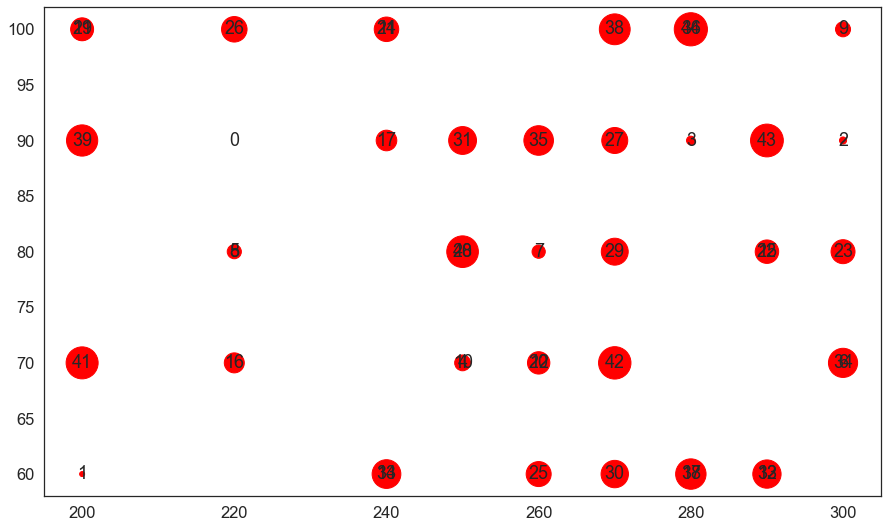

In [70]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [71]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[76.96104828]
[87.56330903]
[108.8545959]
[125.84680143]
[137.15808333]
(118, 1)
[2.949]
[3.57]
[4.53]
[5.27]
[6.191]
(118, 1)
[85.178]
[90.0125]
[98.16]
[105.55]
[111.659]
(118, 1)
[89.98466255]
[100.]
[100.]
[100.]
[100.]
(118, 1)


In [72]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000
#########
(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
9000


In [73]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [74]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [75]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [76]:
dfq50_26.head()

,median26
0,102.404725
1,122.698875
2,134.142745
3,110.154282
4,117.919554


In [77]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [78]:
dfAllAverages.head()

,median26,median45,median85
0,102.404725,111.802183,108.530593
1,122.698875,131.320708,125.071913
2,134.142745,126.364673,131.632203
3,110.154282,104.926714,109.656121
4,117.919554,114.637667,115.372654


In [79]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[76.96104828]
[87.56330903]
[108.8545959]
[125.84680143]
[137.15808333]
(118, 1)
*** RCP2.6***
[78.3795]
[85.24964]
[102.404725]
[125.83242857]
[139.92817241]
(118, 1)
*** RCP4.5***
[75.83583333]
[90.05935192]
[111.80218333]
[125.13848276]
[133.41496]
(118, 1)
*** RCP8.5***
[75.95775]
[88.40688]
[108.53059267]
[126.66469231]
[138.44290909]
(118, 1)


In [80]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[2.949]
[3.57]
[4.53]
[5.27]
[6.191]
(118, 1)
*** RCP2.6***
[2.96]
[3.48]
[4.465]
[5.24]
[6.06]
(118, 1)
*** RCP4.5***
[2.93]
[3.65]
[4.575]
[5.2325]
[6.26]
(118, 1)
*** RCP8.5***
[2.91]
[3.59]
[4.56]
[5.33]
[6.21]
(118, 1)


#### Set the parameters of making figure

In [81]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

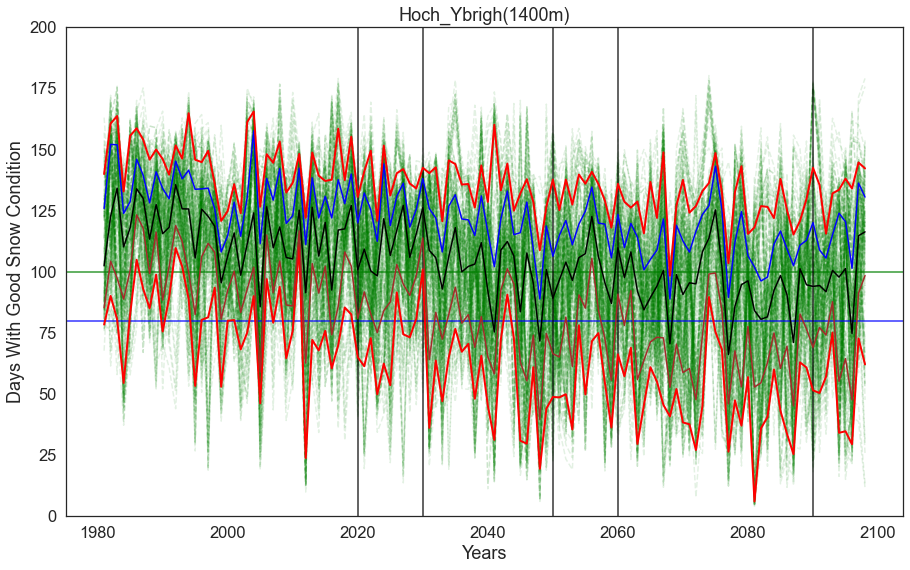

In [82]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

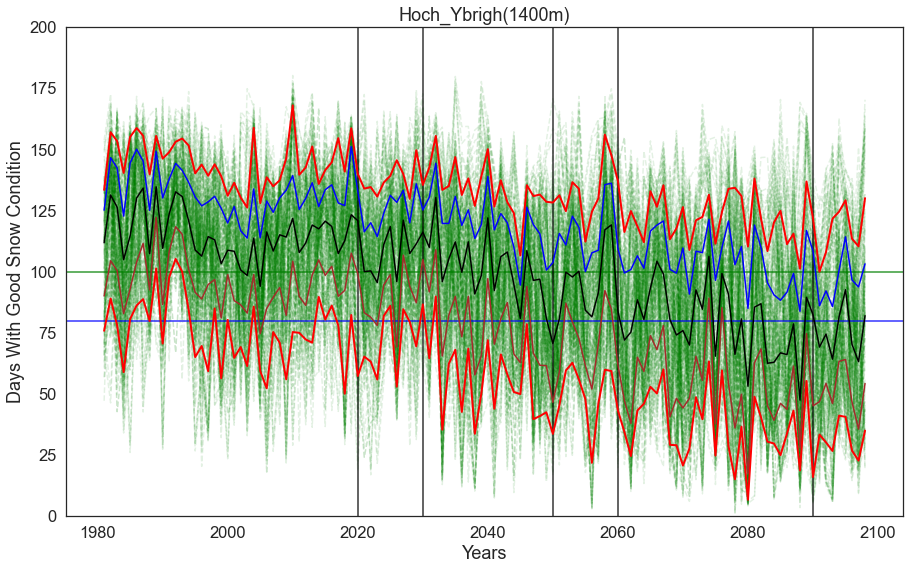

In [83]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

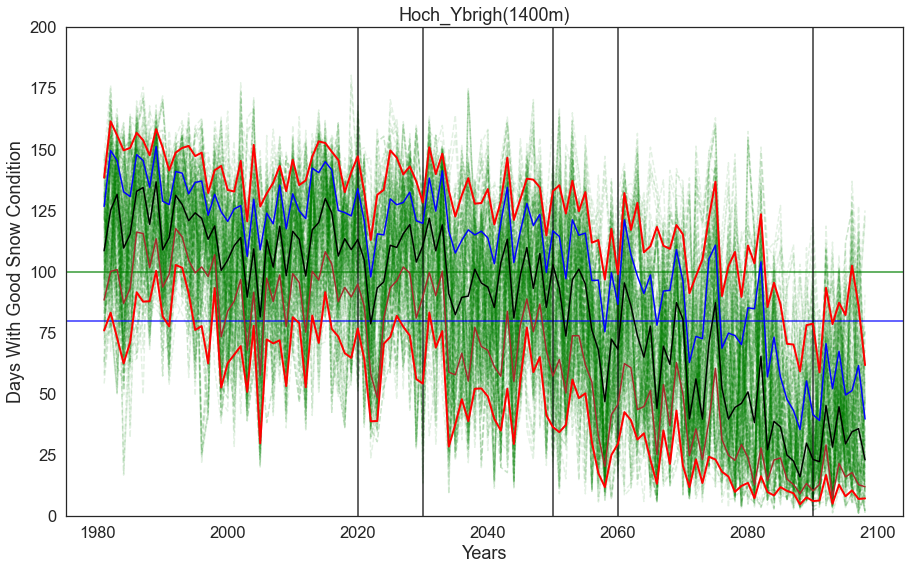

In [84]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [85]:
title_Figs = 'case5_Les Diablerets, elv_b 2000m, RCP2.6'

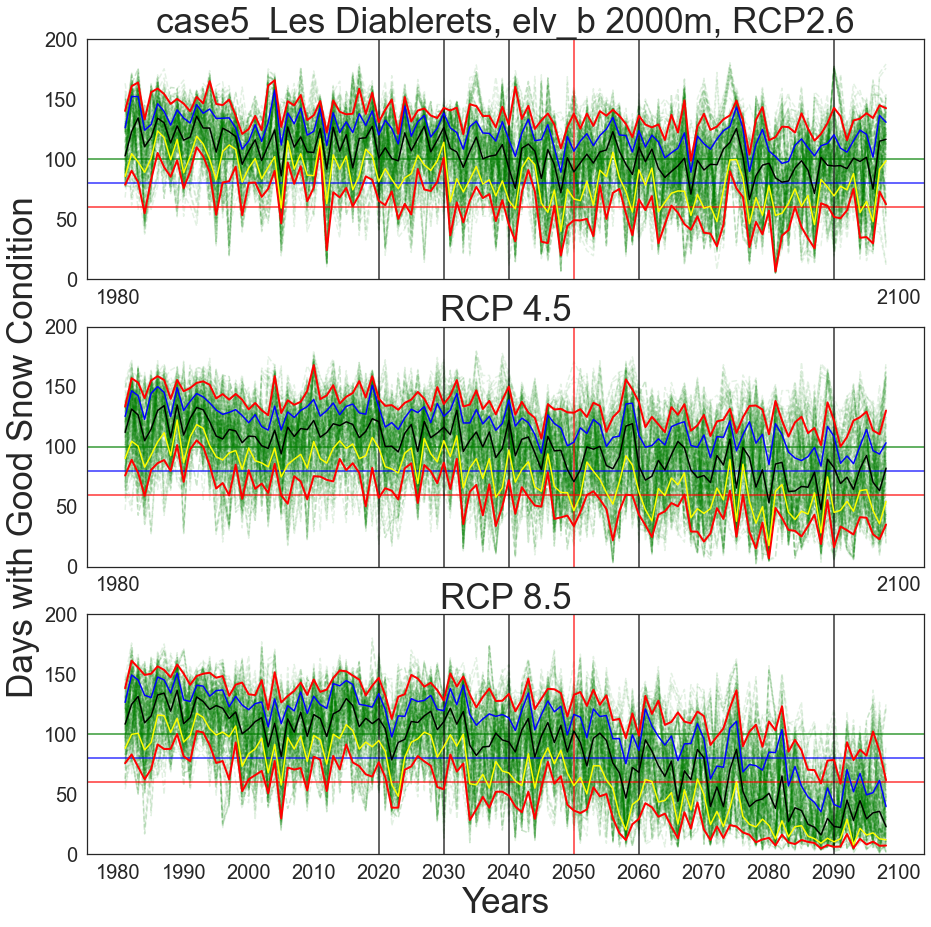

In [86]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

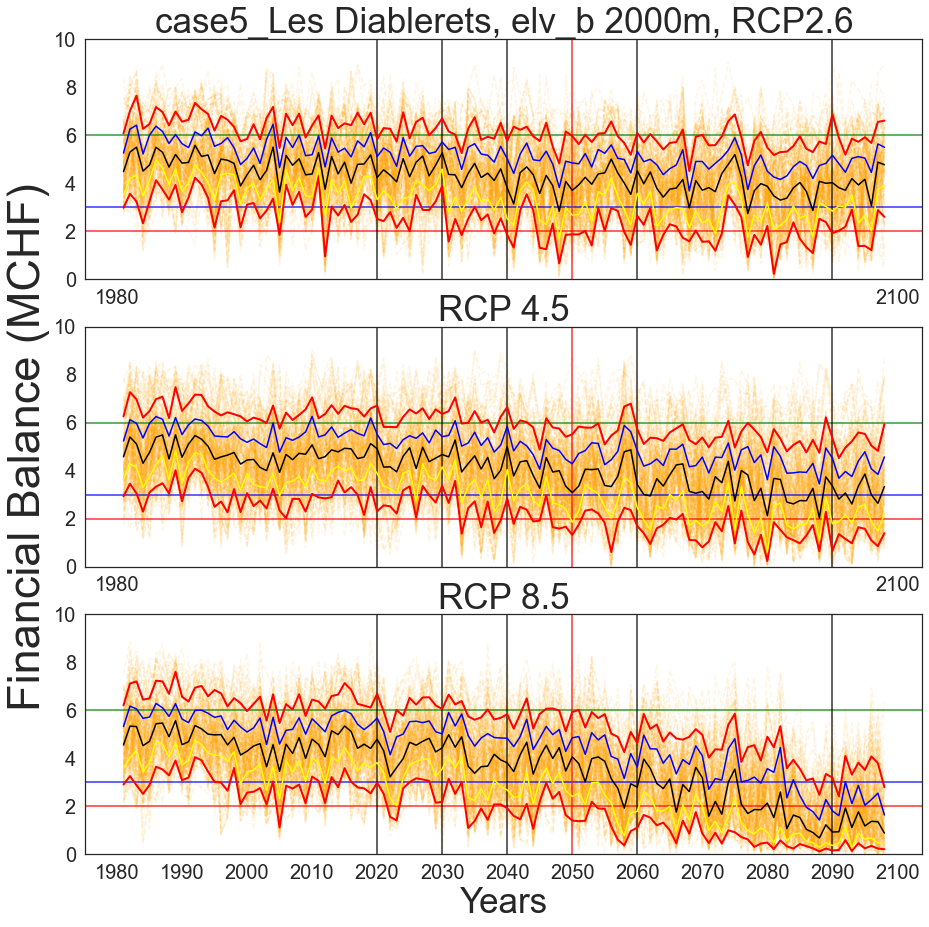

In [87]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

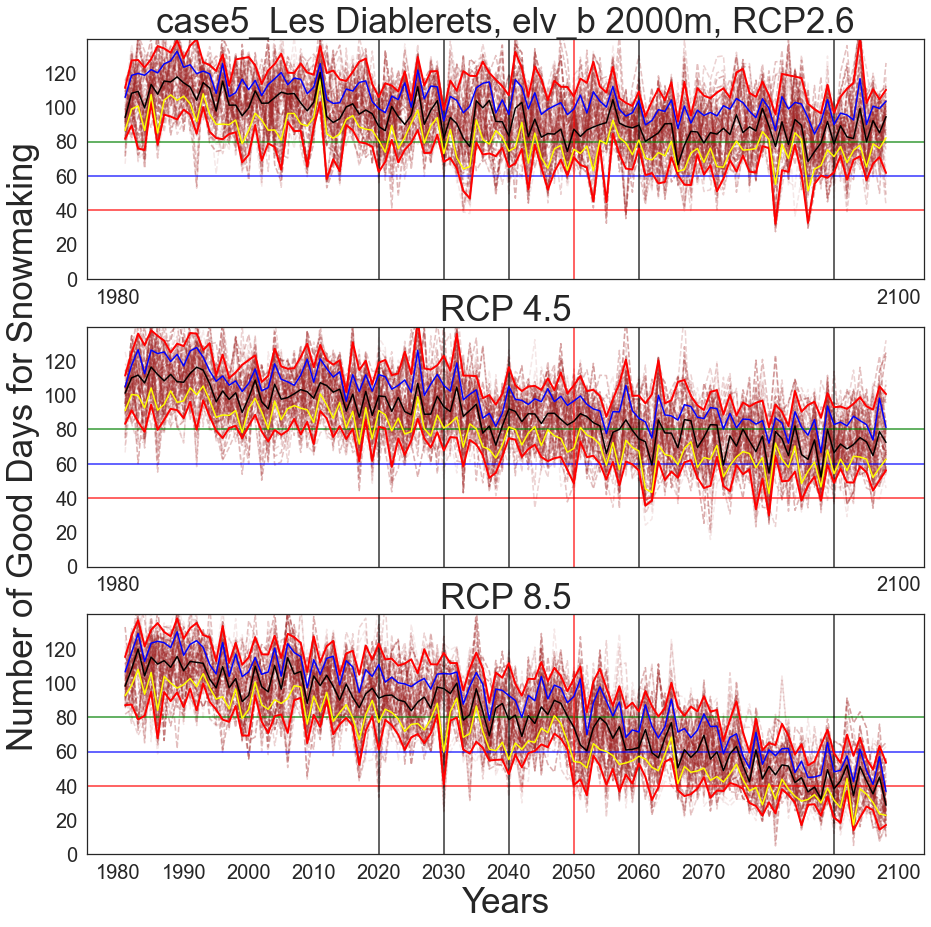

In [88]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

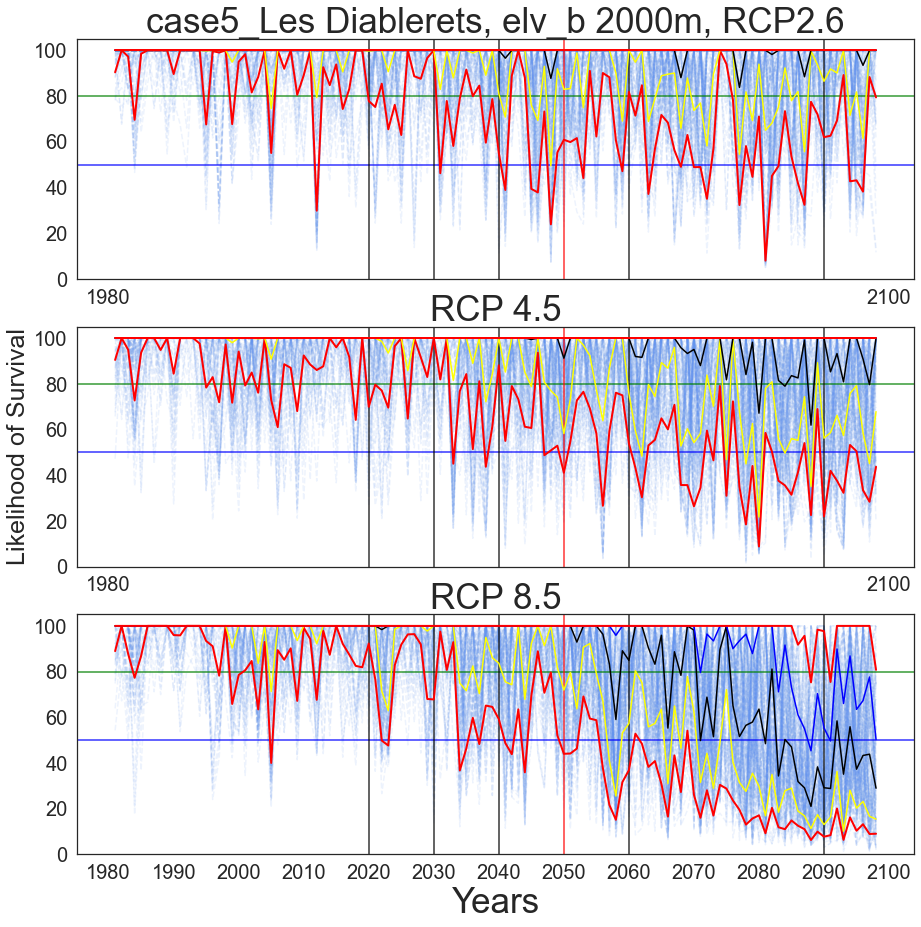

In [89]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [90]:
dfAllAverages.head()

,median26,median45,median85
0,102.404725,111.802183,108.530593
1,122.698875,131.320708,125.071913
2,134.142745,126.364673,131.632203
3,110.154282,104.926714,109.656121
4,117.919554,114.637667,115.372654


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [91]:
title_Figs2 = 'ALes Diablerets,2000m'

In [92]:
y_axis = np.arange(1981, 2100, step= 20)

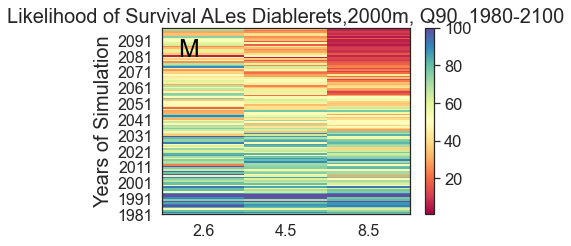

In [93]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'M', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

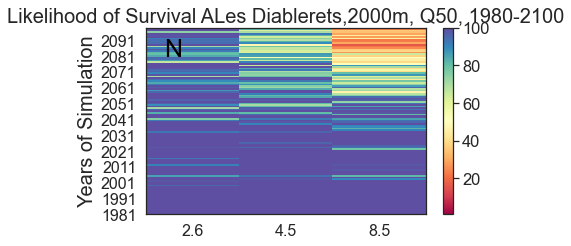

In [94]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'N', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

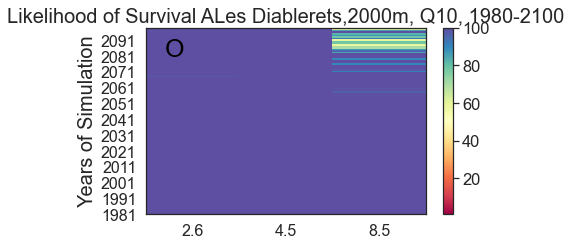

In [95]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'O', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [96]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(2970, 119, 2)
(3060, 119, 2)
(2970, 119, 2)
(9000, 119, 2)


In [97]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [98]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [99]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [100]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'], dtype='<U47')

In [101]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [102]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [103]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [104]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [105]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [106]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [107]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_8'],sc_2_['Money_sc_26_8'],sc_3_['Money_sc_26_7'],sc_4_['Money_sc_26_8'],sc_5_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_6_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_7_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_8_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_9_['Money_sc_26_11'],sc_10_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_11_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_12_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_13_['Money_sc_26_3'],sc_14_['Money_sc_26_2'],sc_15_['Money_sc_26_4'],sc_16_['Money_sc_26_10'],sc_17_['Money_sc_26_2'],sc_18_['Money_sc_26_2'],sc_19_['Money_sc_26_11'],sc_20_['Money_sc_26_5'],sc_21_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_22_['Money_sc_26_4'],sc_23_['Money_sc_26_12'],sc_24_['Money_sc_26_2'],sc_25_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_26_['Money_sc_26_7'],sc_27_['Money_sc_26_6'],sc_28_['Money_sc_26_3'],sc_29_['Money_sc_26_11'],sc_30_['Money_sc_26_10'],sc_31_['Money_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_32_['Money_sc_26_3'],sc_33_['Money_sc_26_4'],...,sc_2937_['Money_sc_26_4'],sc_2938_['Money_sc_26_7'],sc_2939_['Money_sc_26_5'],sc_2940_['Money_sc_26_3'],sc_2941_['Money_sc_26_2'],sc_2942_['Money_sc_26_7'],sc_2943_['Money_sc_26_4'],sc_2944_['Money_sc_26_10'],sc_2945_['Money_sc_26_5'],sc_2946_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2947_['Money_sc_26_9'],sc_2948_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2949_['Money_sc_26_9'],sc_2950_['Money_sc_26_6'],sc_2951_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2952_['Money_sc_26_8'],sc_2953_['Money_sc_26_6'],sc_2954_['Money_sc_26_5'],sc_2955_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2956_['Money_sc_26_8'],sc_2957_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2958_['Money_sc_26_4'],sc_2959_['Money_sc_26_6'],sc_2960_['Money_sc_26_5'],sc_2961_['Money_sc_26_2'],sc_2962_['Money_sc_26_9'],sc_2963_['Money_sc_26_2'],sc_2964_['Money_sc_26_11'],sc_2965_['Money_sc_26_3'],sc_2966_['Money_sc_26_3'],sc_2967_['Money_sc_26_8'],sc_2968_['Money_sc_26_4'],sc_2969_['Money_sc_26_7'],sc_2970_['Money_sc_26_5']
0,1981-1982,6.409999999999986,6.409999999999986,5.149999999999993,6.409999999999986,4.539999999999996,6.479999999999986,6.589999999999986,4.609999999999995,4.269999999999995,7.329999999999982,4.619999999999994,6.8099999999999845,5.429999999999991,7.449999999999982,6.029999999999988,4.859999999999991,4.319999999999993,4.319999999999993,4.189999999999995,4.739999999999994,6.589999999999986,6.029999999999988,5.709999999999988,4.309999999999993,4.609999999999995,7.349999999999983,4.459999999999993,5.389999999999991,7.87999999999998,6.089999999999987,6.449999999999986,5.739999999999988,4.3799999999999955,...,4.300000000000003,5.850000000000005,2.1700000000000004,4.240000000000001,3.470000000000003,5.810000000000005,3.6200000000000023,3.840000000000003,3.720000000000003,4.660000000000004,4.5000000000000036,4.8800000000000034,5.200000000000004,3.550000000000003,5.410000000000005,3.740000000000003,3.6000000000000028,3.720000000000003,3.510000000000003,5.090000000000004,4.8800000000000034,3.6200000000000023,3.550000000000003,2.7999999999999963,5.910000000000005,5.200000000000004,4.319999999999993,6.200000000000005,3.509999999999994,4.550000000000003,4.020000000000003,4.860000000000004,7.349999999999983,3.120000000000001
1,1982-1983,5.669999999999988,5.669999999999988,5.21999999999999,5.679999999999988,7.92999999999998,8.02999999999998,8.84999999999999,7.92999999999998,6.489999999999988,8.309999999999985,5.009999999999991,6.1299999999999875,8.039999999999981,5.619999999999989,8.149999999999983,5.459999999999989,4.799999999999993,4.799999999999993,6.489999999999988,7.92999999999998,8.499999999999988,8.149999999999983,6.549999999999986,4.799999999999993,7.92999999999998,6.759999999999985,5.809999999999988,8.039999999999981,6.109999999999989,5.499999999999989,3.0199999999999965,6.519999999999986,5.069999999999991,...,6.000000000000004,5.670000000000004,4.6300000000000034,6.320000000000005,3.5600000000000027,4.9

In [108]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [109]:
df45_all_fin.head(7)

,Season,sc_1_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_3_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_4_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_5_['Money_sc_45_14'],sc_6_['Money_sc_45_22'],sc_7_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_8_['Money_sc_45_13'],sc_9_['Money_sc_45_6'],sc_10_['Money_sc_45_2'],sc_11_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_12_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_13_['Money_sc_45_3'],sc_14_['Money_sc_45_14'],sc_15_['Money_sc_45_1'],sc_16_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_17_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['Money_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_19_['Money_sc_45_18'],sc_20_['Money_sc_45_24'],sc_21_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_22_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_23_['Money_sc_45_9'],sc_24_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_25_['Money_sc_45_15'],sc_26_['Money_sc_45_17'],sc_27_['Money_sc_45_10'],sc_28_['Money_sc_45_15'],sc_29_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_30_['Money_sc_45_25'],sc_31_['Money_sc_45_16'],sc_32_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_33_['Money_sc_45_4'],...,sc_3027_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_3028_['Money_sc_45_24'],sc_3029_['Money_sc_45_1'],sc_3030_['Money_sc_45_12'],sc_3031_['Money_sc_45_6'],sc_3032_['Money_sc_45_11'],sc_3033_['Money_sc_45_12'],sc_3034_['Money_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_3035_['Money_sc_45_14'],sc_3036_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3037_['Money_sc_45_6'],sc_3038_['Money_sc_45_17'],sc_3039_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_3040_['Money_sc_45_17'],sc_3041_['Money_sc_45_2'],sc_3042_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_3043_['Money_sc_45_21'],sc_3044_['Money_sc_45_3'],sc_3045_['Money_sc_45_8'],sc_3046_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_3047_['Money_sc_45_11'],sc_3048_['Money_sc_45_15'],sc_3049_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3050_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_3051_['Money_sc_45_19'],sc_3052_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_3053_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3054_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_3055_['Money_sc_45_5'],sc_3056_['Money_sc_45_1'],sc_3057_['Money_sc_45_14'],sc_3058_['Money_sc_45_25'],sc_3059_['Money_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_3060_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp']
0,1981-1982,6.399999999999989,6.019999999999988,6.199999999999987,6.399999999999989,4.879999999999993,6.189999999999987,6.019999999999988,3.6699999999999955,4.909999999999996,6.829999999999984,4.299999999999995,4.139999999999997,5.19999999999999,6.2599999999999865,6.039999999999989,4.849999999999992,4.149999999999995,5.839999999999988,3.119999999999997,6.819999999999984,6.699999999999985,7.029999999999983,4.309999999999997,5.769999999999988,5.159999999999992,4.779999999999992,6.929999999999984,5.109999999999991,6.199999999999987,3.870000000000003,6.439999999999986,6.159999999999987,6.229999999999986,...,4.530000000000003,5.480000000000004,5.240000000000004,4.730000000000004,3.8100000000000014,5.300000000000004,4.479999999999997,4.330000000000003,4.930000000000003,4.710000000000003,3.8100000000000014,3.730000000000003,5.410000000000005,4.889999999999992,5.930000000000005,4.620000000000004,4.7100000000000035,5.510000000000004,4.760000000000003,5.590000000000004,5.300000000000004,3.6099999999999977,6.4699999999999855,4.7500000000000036,4.450000000000004,6.070000000000005,3.269999999999999,4.730000000000004,2.659999999999998,3.6200000000000023,4.930000000000003,5.020000000000004,4.540000000000004,5.1300000000000034
1,1982-1983,7.96999999999998,8.159999999999982,7.559999999999982,7.96999999999998,6.8499999999999845,5.1899999999999915,8.159999999999982,6.589999999999987,7.389999999999983,5.989999999999988,7.899999999999981,4.929999999999992,7.149999999999984,7.199999999999983,5.309999999999996,5.539999999999989,5.160000000000001,7.399999999999983,6.66999999999

In [110]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [111]:
df85_all_fin.head(7)

,Season,sc_1_['Money_sc_85_29'],sc_2_['Money_sc_85_13'],sc_3_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_4_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_5_['Money_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_6_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_7_['Money_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_8_['Money_sc_85_6'],sc_9_['Money_sc_85_16'],sc_10_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_11_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_12_['Money_sc_85_6'],sc_13_['Money_sc_85_4'],sc_14_['Money_sc_85_30'],sc_15_['Money_sc_85_28'],sc_16_['Money_sc_85_14'],sc_17_['Money_sc_85_21'],sc_18_['Money_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_19_['Money_sc_85_24'],sc_20_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_21_['Money_sc_85_6'],sc_22_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_23_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_24_['Money_sc_85_20'],sc_25_['Money_sc_85_4'],sc_26_['Money_sc_85_18'],sc_27_['Money_sc_85_21'],sc_28_['Money_sc_85_5'],sc_29_['Money_sc_85_29'],sc_30_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP85-pcp'],sc_31_['Money_sc_85_28'],sc_32_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_33_['Money_sc_85_6'],...,sc_2937_['Money_sc_85_29'],sc_2938_['Money_sc_85_12'],sc_2939_['Money_sc_85_4'],sc_2940_['Money_sc_85_26'],sc_2941_['Money_sc_85_5'],sc_2942_['Money_sc_85_24'],sc_2943_['Money_sc_85_23'],sc_2944_['Money_sc_85_27'],sc_2945_['Money_sc_85_1'],sc_2946_['Money_sc_85_1'],sc_2947_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP85-pcp'],sc_2948_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2949_['Money_sc_85_16'],sc_2950_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_2951_['Money_sc_85_20'],sc_2952_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP85-pcp'],sc_2953_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_2954_['Money_sc_85_28'],sc_2955_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2956_['Money_sc_85_19'],sc_2957_['Money_sc_85_8'],sc_2958_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_2959_['Money_sc_85_28'],sc_2960_['Money_sc_85_28'],sc_2961_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2962_['Money_sc_85_26'],sc_2963_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2964_['Money_sc_85_3'],sc_2965_['Money_sc_85_8'],sc_2966_['Money_sc_85_4'],sc_2967_['Money_sc_85_30'],sc_2968_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_2969_['Money_sc_85_1'],sc_2970_['Money_sc_85_14']
0,1981-1982,5.689999999999991,6.029999999999989,5.849999999999988,4.569999999999996,3.9199999999999977,5.74999999999999,5.959999999999991,5.8899999999999935,6.579999999999986,6.369999999999986,6.819999999999986,6.279999999999987,5.38999999999999,4.249999999999994,4.789999999999992,6.889999999999984,5.189999999999991,4.329999999999994,7.599999999999982,6.559999999999985,3.079999999999996,4.939999999999994,4.959999999999991,7.349999999999983,5.38999999999999,5.989999999999989,6.869999999999984,6.659999999999985,5.689999999999991,4.6799999999999935,4.789999999999992,4.569999999999996,5.8899999999999935,...,5.689999999999991,5.3300000000000045,4.040000000000003,4.679999999999996,5.090000000000004,6.060000000000005,3.470000000000003,6.060000000000005,4.030000000000003,2.62,4.6799999999999935,4.390000000000001,5.160000000000004,4.690000000000004,5.850000000000005,3.5400000000000027,5.270000000000004,5.3300000000000045,5.400000000000004,3.640000000000003,4.800000000000003,5.270000000000004,4.789999999999992,4.630000000000006,3.490000000000003,5.700000000000005,4.28,4.620000000000004,5.210000000000004,3.860000000000003,3.3500000000000028,5.160000000000004,2.6599999999999997,5.510000000000004
1,1982-1983,8.02999999999998,7.179999999999984,7.209999999999984,5.479999999999989,5.499999999999989,7.459999999999982,7.399999999999983,2.970000000000002,6.10999999999999,7.649999999999982,5.189999999999996,3.9199999999999915,7.369999999999982,6.919999999999985,5.479999999999989,4.8299999999999965,7.299999999999983,5.139999999999991,8.119999999999981,8.84999999999999,7.6999999999999815,5.509999999999989,5.539999999999989,7.92999999999998,7.369999999999982,7.889999999999981,6.32999

In [112]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [113]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_8'],sc_2_['ArtSnowPossibility_sc_26_8'],sc_3_['ArtSnowPossibility_sc_26_7'],sc_4_['ArtSnowPossibility_sc_26_8'],sc_5_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_6_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_7_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_8_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_9_['ArtSnowPossibility_sc_26_11'],sc_10_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_11_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_12_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_13_['ArtSnowPossibility_sc_26_3'],sc_14_['ArtSnowPossibility_sc_26_2'],sc_15_['ArtSnowPossibility_sc_26_4'],sc_16_['ArtSnowPossibility_sc_26_10'],sc_17_['ArtSnowPossibility_sc_26_2'],sc_18_['ArtSnowPossibility_sc_26_2'],sc_19_['ArtSnowPossibility_sc_26_11'],sc_20_['ArtSnowPossibility_sc_26_5'],sc_21_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_22_['ArtSnowPossibility_sc_26_4'],sc_23_['ArtSnowPossibility_sc_26_12'],sc_24_['ArtSnowPossibility_sc_26_2'],sc_25_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_26_['ArtSnowPossibility_sc_26_7'],sc_27_['ArtSnowPossibility_sc_26_6'],sc_28_['ArtSnowPossibility_sc_26_3'],sc_29_['ArtSnowPossibility_sc_26_11'],sc_30_['ArtSnowPossibility_sc_26_10'],sc_31_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_32_['ArtSnowPossibility_sc_26_3'],sc_33_['ArtSnowPossibility_sc_26_4'],...,sc_2937_['ArtSnowPossibility_sc_26_4'],sc_2938_['ArtSnowPossibility_sc_26_7'],sc_2939_['ArtSnowPossibility_sc_26_5'],sc_2940_['ArtSnowPossibility_sc_26_3'],sc_2941_['ArtSnowPossibility_sc_26_2'],sc_2942_['ArtSnowPossibility_sc_26_7'],sc_2943_['ArtSnowPossibility_sc_26_4'],sc_2944_['ArtSnowPossibility_sc_26_10'],sc_2945_['ArtSnowPossibility_sc_26_5'],sc_2946_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2947_['ArtSnowPossibility_sc_26_9'],sc_2948_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2949_['ArtSnowPossibility_sc_26_9'],sc_2950_['ArtSnowPossibility_sc_26_6'],sc_2951_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2952_['ArtSnowPossibility_sc_26_8'],sc_2953_['ArtSnowPossibility_sc_26_6'],sc_2954_['ArtSnowPossibility_sc_26_5'],sc_2955_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2956_['ArtSnowPossibility_sc_26_8'],sc_2957_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2958_['ArtSnowPossibility_sc_26_4'],sc_2959_['ArtSnowPossibility_sc_26_6'],sc_2960_['ArtSnowPossibility_sc_26_5'],sc_2961_['ArtSnowPossibility_sc_26_2'],sc_2962_['ArtSnowPossibility_sc_26_9'],sc_2963_['ArtSnowPossibility_sc_26_2'],sc_2964_['ArtSnowPossibility_sc_26_11'],sc_2965_['ArtSnowPossibility_sc_26_3'],sc_2966_['ArtSnowPossibility_sc_26_3'],sc_2967_['ArtSnowPossibility_sc_26_8'],sc_2968_['ArtSnowPossibility_sc_26_4'],sc_2969_['ArtSnowPossibility_sc_26_7'],sc_2970_['ArtSnowPossibility_sc_26_5']
0,1981-1982,92.08999999999997,92.08999999999997,106.35000000000002,85.77000000000001,88.72000000000001,85.34000000000002,85.99,92.96999999999998,99.21,105.85,83.63000000000001,109.8,81.63,112.32,67.05999999999999,88.90999999999998,114.38,111.33999999999997,100.07,99.58,91.31000000000002,73.48,76.82,107.32,84.08000000000001,112.34000000000002,95.02000000000001,91.54999999999998,86.58,93.96999999999998,97.23999999999998,80.68999999999998,115.91000000000001,...,71.34999999999997,108.38999999999997,98.68999999999998,81.63,107.32,113.64,108.56999999999998,93.90999999999998,97.13000000000001,109.27000000000001,88.23000000000002,90.03,100.22999999999999,94.78000000000002,99.13999999999999,80.39999999999998,94.3,106.52,103.33000000000001,86.34000000000002,92.82000000000001,115.58000000000001,95.37,90.48000000000002,110.07,98.98999999999997,109.27999999999997,81.85999999999997,88.44,86.89999999999999,83.14000000000003,71.34999999999997,108.38999999999997,98.68999999999998
1,1982-1983,91.38000000000002,91.38000000000002,115.73000000000002,83.680000000000

In [114]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [115]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_3_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_4_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_5_['ArtSnowPossibility_sc_45_14'],sc_6_['ArtSnowPossibility_sc_45_22'],sc_7_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_8_['ArtSnowPossibility_sc_45_13'],sc_9_['ArtSnowPossibility_sc_45_6'],sc_10_['ArtSnowPossibility_sc_45_2'],sc_11_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_12_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_13_['ArtSnowPossibility_sc_45_3'],sc_14_['ArtSnowPossibility_sc_45_14'],sc_15_['ArtSnowPossibility_sc_45_1'],sc_16_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_17_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_19_['ArtSnowPossibility_sc_45_18'],sc_20_['ArtSnowPossibility_sc_45_24'],sc_21_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_22_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_23_['ArtSnowPossibility_sc_45_9'],sc_24_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_45_15'],sc_26_['ArtSnowPossibility_sc_45_17'],sc_27_['ArtSnowPossibility_sc_45_10'],sc_28_['ArtSnowPossibility_sc_45_15'],sc_29_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_30_['ArtSnowPossibility_sc_45_25'],sc_31_['ArtSnowPossibility_sc_45_16'],sc_32_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_33_['ArtSnowPossibility_sc_45_4'],...,sc_3027_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_3028_['ArtSnowPossibility_sc_45_24'],sc_3029_['ArtSnowPossibility_sc_45_1'],sc_3030_['ArtSnowPossibility_sc_45_12'],sc_3031_['ArtSnowPossibility_sc_45_6'],sc_3032_['ArtSnowPossibility_sc_45_11'],sc_3033_['ArtSnowPossibility_sc_45_12'],sc_3034_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_3035_['ArtSnowPossibility_sc_45_14'],sc_3036_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3037_['ArtSnowPossibility_sc_45_6'],sc_3038_['ArtSnowPossibility_sc_45_17'],sc_3039_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_3040_['ArtSnowPossibility_sc_45_17'],sc_3041_['ArtSnowPossibility_sc_45_2'],sc_3042_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_3043_['ArtSnowPossibility_sc_45_21'],sc_3044_['ArtSnowPossibility_sc_45_3'],sc_3045_['ArtSnowPossibility_sc_45_8'],sc_3046_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_3047_['ArtSnowPossibility_sc_45_11'],sc_3048_['ArtSnowPossibility_sc_45_15'],sc_3049_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3050_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_3051_['ArtSnowPossibility_sc_45_19'],sc_3052_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_3053_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3054_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_3055_['ArtSnowPossibility_sc_45_5'],sc_3056_['ArtSnowPossibility_sc_45_1'],sc_3057_['ArtSnowPossibility_sc_45_14'],sc_3058_['ArtSnowPossibility_sc_45_25'],sc_3059_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_3060_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp']
0,1981-1982,88.54,104.28999999999999,88.94999999999997,88.54,74.85999999999999,102.53999999999999,104.28999999999999,80.77999999999999,109.60999999999997,104.4,99.93999999999997,95.71999999999997,125.29999999999997,111.43,118.36000000000001,104.19000000000001,98.37,105.85999999999999,70.52999999999999,108.38000000000001,104.00000000000006,91.00999999999999,105.50000000000003,107.31,89.81000000000002,98.55000000000001,94.57999999999997,83.84,91.03,99.63999999999999,101.25999999999999,95.13000000000001,100.06000000000002,...,107.31,106.88999999999997,114.86000000000001,85.35000000000001,113.2,90.92999999999998,88.80000000000001,104.83999999999999,101.35,91.23999999999998,101.80999999999999,104.68,110.3

In [116]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [117]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_85_29'],sc_2_['ArtSnowPossibility_sc_85_13'],sc_3_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_4_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_5_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP85-pcp'],sc_6_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_7_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_8_['ArtSnowPossibility_sc_85_6'],sc_9_['ArtSnowPossibility_sc_85_16'],sc_10_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_11_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_12_['ArtSnowPossibility_sc_85_6'],sc_13_['ArtSnowPossibility_sc_85_4'],sc_14_['ArtSnowPossibility_sc_85_30'],sc_15_['ArtSnowPossibility_sc_85_28'],sc_16_['ArtSnowPossibility_sc_85_14'],sc_17_['ArtSnowPossibility_sc_85_21'],sc_18_['ArtSnowPossibility_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_19_['ArtSnowPossibility_sc_85_24'],sc_20_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_21_['ArtSnowPossibility_sc_85_6'],sc_22_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_23_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_24_['ArtSnowPossibility_sc_85_20'],sc_25_['ArtSnowPossibility_sc_85_4'],sc_26_['ArtSnowPossibility_sc_85_18'],sc_27_['ArtSnowPossibility_sc_85_21'],sc_28_['ArtSnowPossibility_sc_85_5'],sc_29_['ArtSnowPossibility_sc_85_29'],sc_30_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP85-pcp'],sc_31_['ArtSnowPossibility_sc_85_28'],sc_32_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_33_['ArtSnowPossibility_sc_85_6'],...,sc_2937_['ArtSnowPossibility_sc_85_29'],sc_2938_['ArtSnowPossibility_sc_85_12'],sc_2939_['ArtSnowPossibility_sc_85_4'],sc_2940_['ArtSnowPossibility_sc_85_26'],sc_2941_['ArtSnowPossibility_sc_85_5'],sc_2942_['ArtSnowPossibility_sc_85_24'],sc_2943_['ArtSnowPossibility_sc_85_23'],sc_2944_['ArtSnowPossibility_sc_85_27'],sc_2945_['ArtSnowPossibility_sc_85_1'],sc_2946_['ArtSnowPossibility_sc_85_1'],sc_2947_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP85-pcp'],sc_2948_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2949_['ArtSnowPossibility_sc_85_16'],sc_2950_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_2951_['ArtSnowPossibility_sc_85_20'],sc_2952_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP85-pcp'],sc_2953_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_2954_['ArtSnowPossibility_sc_85_28'],sc_2955_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2956_['ArtSnowPossibility_sc_85_19'],sc_2957_['ArtSnowPossibility_sc_85_8'],sc_2958_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_2959_['ArtSnowPossibility_sc_85_28'],sc_2960_['ArtSnowPossibility_sc_85_28'],sc_2961_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2962_['ArtSnowPossibility_sc_85_26'],sc_2963_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2964_['ArtSnowPossibility_sc_85_3'],sc_2965_['ArtSnowPossibility_sc_85_8'],sc_2966_['ArtSnowPossibility_sc_85_4'],sc_2967_['ArtSnowPossibility_sc_85_30'],sc_2968_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_2969_['ArtSnowPossibility_sc_85_1'],sc_2970_['ArtSnowPossibility_sc_85_14']
0,1981-1982,97.33,92.82000000000002,99.72000000000001,90.87999999999998,95.91,91.63,93.24,97.0,103.60000000000001,103.70999999999998,125.30999999999999,97.14,90.44,97.71999999999998,104.43,86.02999999999999,92.56,97.85999999999999,86.67,87.14999999999998,101.03000000000002,89.07999999999998,105.70000000000002,117.02999999999999,91.67999999999999,108.02999999999999,98.36000000000003,96.12,98.01,87.09,94.67999999999999,90.87999999999998,97.0,...,98.01,109.51,108.04999999999998,115.17,101.08000000000004,102.24,116.03,132.68000000000006,104.44999999999997,101.36000000000001,87.09,95.8,112.02999999999999,106.50000000000001,103.65,89.96000000000001,89.94,107.43,112.01,85.3,120.79,86.52999999999999,94.67999999999999,108.42999999999999,95.94,110.54,97.85000000000001,81.82000000000001,110.85000000000001,104.47999999

### Survival Map CH2018 RCP2.6

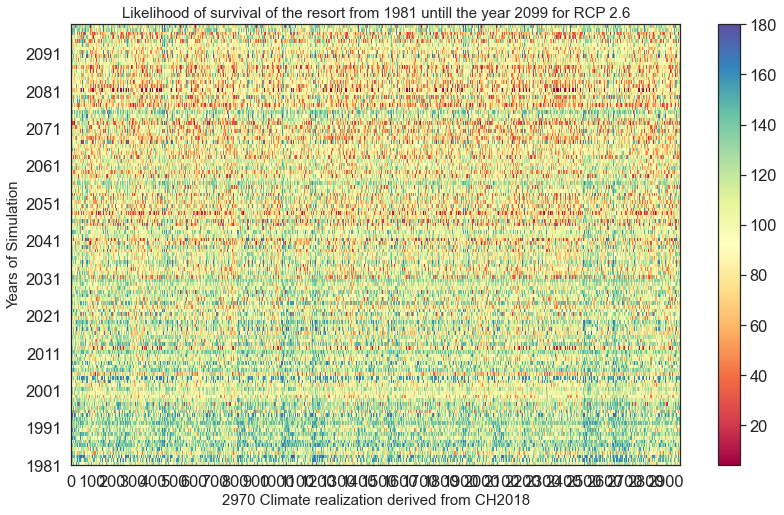

In [118]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

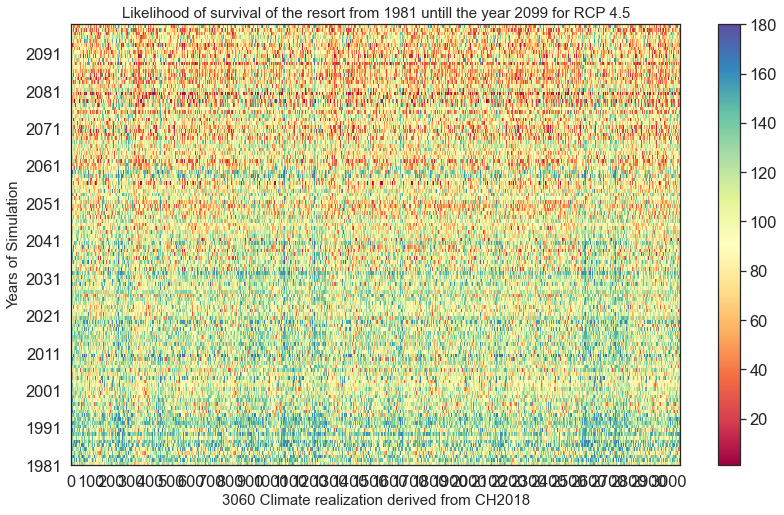

In [119]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

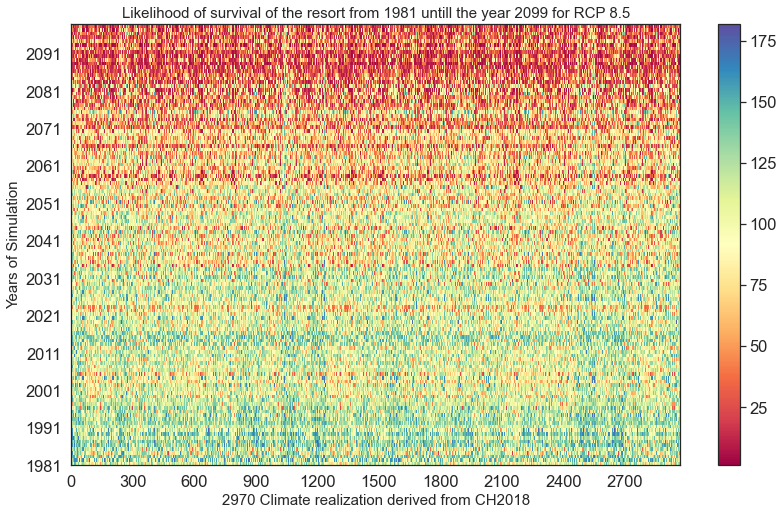

In [120]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [121]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [122]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [123]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [124]:
df26_all.shape

(118, 2971)

In [125]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [126]:
type(df26_all)

pandas.core.frame.DataFrame

In [127]:
thresholds_85_sce_m

array([  2,   3,   9, ..., 196, 198, 199], dtype=int64)

In [128]:
thresholds_45_sce_m

array([  0,   4,   8, ..., 185, 192, 197], dtype=int64)

In [129]:
df26_allColumns = df26_all.columns

In [130]:
df26_all[df26_allColumns[1]].iloc[0]

'128.66163636363638'

In [131]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_8'],sc_2_['isOverSnow_sc_26_8'],sc_3_['isOverSnow_sc_26_7'],sc_4_['isOverSnow_sc_26_8'],sc_5_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_6_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_7_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_9_['isOverSnow_sc_26_11'],sc_10_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_11_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_26_3'],sc_14_['isOverSnow_sc_26_2'],sc_15_['isOverSnow_sc_26_4'],sc_16_['isOverSnow_sc_26_10'],sc_17_['isOverSnow_sc_26_2'],sc_18_['isOverSnow_sc_26_2'],sc_19_['isOverSnow_sc_26_11'],sc_20_['isOverSnow_sc_26_5'],sc_21_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_22_['isOverSnow_sc_26_4'],sc_23_['isOverSnow_sc_26_12'],sc_24_['isOverSnow_sc_26_2'],sc_25_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_26_['isOverSnow_sc_26_7'],sc_27_['isOverSnow_sc_26_6'],sc_28_['isOverSnow_sc_26_3'],sc_29_['isOverSnow_sc_26_11'],sc_30_['isOverSnow_sc_26_10'],sc_31_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_32_['isOverSnow_sc_26_3'],sc_33_['isOverSnow_sc_26_4'],...,sc_2937_['isOverSnow_sc_26_4'],sc_2938_['isOverSnow_sc_26_7'],sc_2939_['isOverSnow_sc_26_5'],sc_2940_['isOverSnow_sc_26_3'],sc_2941_['isOverSnow_sc_26_2'],sc_2942_['isOverSnow_sc_26_7'],sc_2943_['isOverSnow_sc_26_4'],sc_2944_['isOverSnow_sc_26_10'],sc_2945_['isOverSnow_sc_26_5'],sc_2946_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2947_['isOverSnow_sc_26_9'],sc_2948_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2949_['isOverSnow_sc_26_9'],sc_2950_['isOverSnow_sc_26_6'],sc_2951_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2952_['isOverSnow_sc_26_8'],sc_2953_['isOverSnow_sc_26_6'],sc_2954_['isOverSnow_sc_26_5'],sc_2955_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2956_['isOverSnow_sc_26_8'],sc_2957_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2958_['isOverSnow_sc_26_4'],sc_2959_['isOverSnow_sc_26_6'],sc_2960_['isOverSnow_sc_26_5'],sc_2961_['isOverSnow_sc_26_2'],sc_2962_['isOverSnow_sc_26_9'],sc_2963_['isOverSnow_sc_26_2'],sc_2964_['isOverSnow_sc_26_11'],sc_2965_['isOverSnow_sc_26_3'],sc_2966_['isOverSnow_sc_26_3'],sc_2967_['isOverSnow_sc_26_8'],sc_2968_['isOverSnow_sc_26_4'],sc_2969_['isOverSnow_sc_26_7'],sc_2970_['isOverSnow_sc_26_5']
0,1981-1982,128.66163636363638,128.66163636363638,106.20872727272727,128.60177272727273,92.74731818181822,130.41418181818182,134.84813636363637,94.94513636363642,87.77395454545453,150.02359090909087,93.68186363636366,137.40090909090907,110.76859090909086,149.08095454545455,121.83845454545454,99.37595454545456,92.84363636363639,92.87868181818183,86.3180909090909,97.0760454545455,134.84813636363637,121.847,116.71145454545454,92.32418181818183,94.90768181818187,147.75281818181818,91.22136363636362,110.23404545454544,159.7238181818182,122.6720909090909,129.8610909090909,117.3542727272727,88.8346363636364,...,111.89903571428572,144.9314,62.86110714285715,98.94976,85.58059999999996,142.59052,82.91644,92.73975999999999,90.10544000000002,115.04052000000001,107.045,117.76380000000003,128.65483999999998,85.59748,133.63748,88.43115999999996,86.56800000000001,90.10476000000003,85.24964,126.69980000000001,122.26916,82.91644,85.84212,65.34207999999992,146.87832,128.65483999999998,92.84363636363639,155.35052000000002,87.90935999999996,108.2712,98.52680000000005,117.76351999999997,147.75281818181818,70.40443999999998
1,1982-1983,114.11186363636362,114.11186363636362,107.22604545454547,114.20040909090909,161.92013636363635,161.39704545454543,176.80059090909091,161.9895454545454,129.80709090909093,166.56872727272727,103.1087272727273,123.87977272727274,160.5917727272727,114.4824090909091,163.00004545454544,108.01531818181817,95.73863636363629,95.94381818181813,129.80709090909093,161.9895454545454,170.0704090909091,163.00004545454544,133.36395454545453,96.13390909090909,161.92013636363635

In [132]:
thresholds_45_sce_m.shape

(3060,)

In [133]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
90.0
0
81


In [134]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [135]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [136]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [137]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

2046
1639
740


In [138]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

2046
1639
740


In [139]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

2046
1639
740


In [140]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

2971
3061
2971


In [141]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

2970
3060
2970


In [142]:
type(T1RCP85)

numpy.ndarray

In [143]:
T1RCP85.shape

(2971,)

In [144]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [145]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [146]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,9.0,0,1,7.0,0.0,0.0,5.0,0.0,16.0
1,9.0,0,5,7.0,0.0,4.0,9.0,0.0,38.0
2,5.0,0,6,7.0,0.0,10.0,8.0,0.0,78.0
3,9.0,0,7,9.0,0.0,15.0,6.0,0.0,86.0
4,2.0,0,14,7.0,0.0,17.0,9.0,0.0,90.0
5,6.0,0,20,7.0,0.0,24.0,8.0,0.0,126.0
6,1.0,0,21,0.0,0.0,26.0,8.0,0.0,142.0
7,7.0,0,23,2.0,0.0,27.0,6.0,0.0,172.0
8,3.0,0,25,9.0,0.0,33.0,7.0,0.0,186.0
9,2.0,0,29,1.0,0.0,36.0,8.0,0.0,190.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [147]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [148]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3060
The lengthe of X is: 3060
***
The lengthe of Y is: 2970
The lengthe of X is: 2970


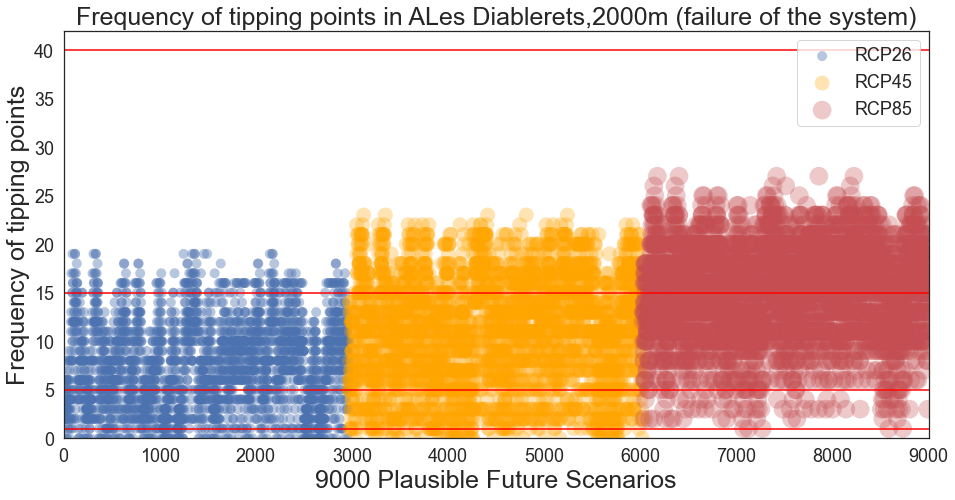

In [149]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

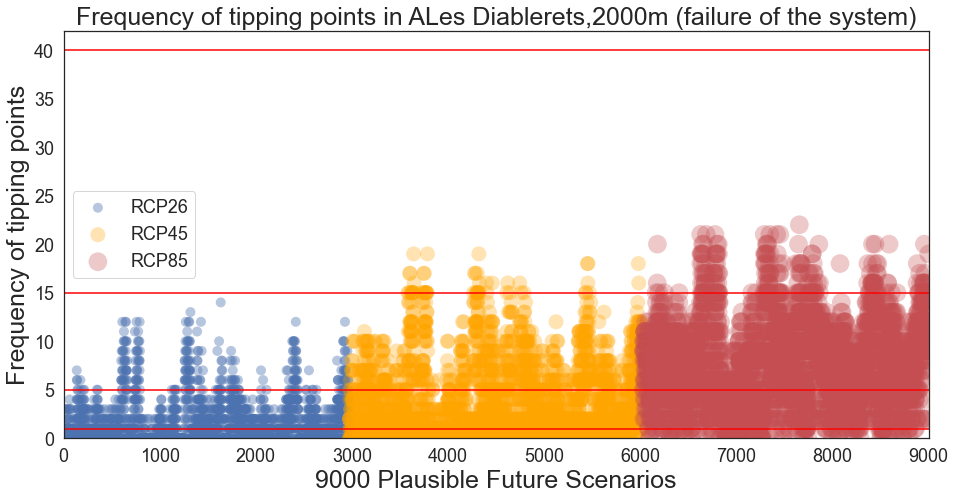

In [150]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

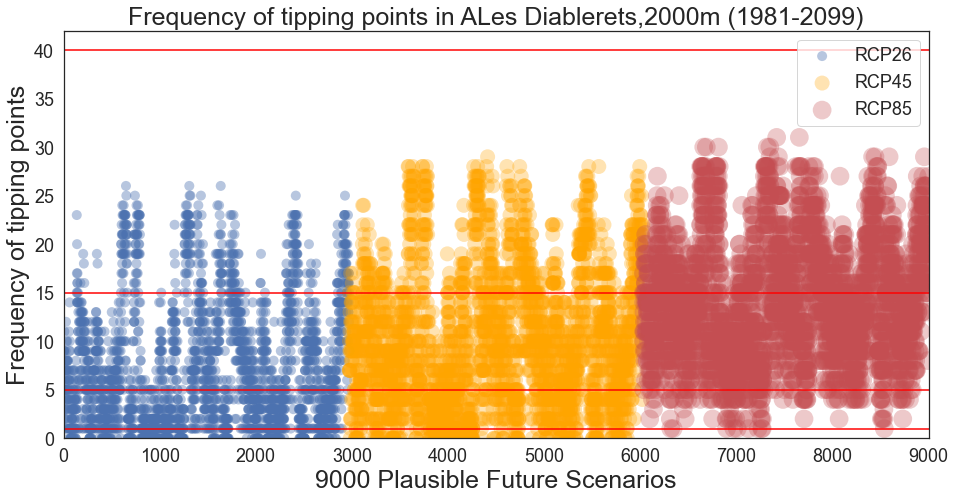

In [151]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [152]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,220.0,90.0,1,0,UZHModel,106.802956,7,128.661636,114.111864,138.079091,129.469909,134.227364,159.512545,145.141591,120.660227,135.786818,117.625591,138.022591,124.258136,140.279182,107.806727,102.725909,99.512000,145.375955,127.129227,57.834909,99.189273,...,117.206000,137.331273,41.339545,115.578545,119.082136,109.578045,92.258409,130.142955,66.440864,90.617000,129.512000,117.188182,69.997318,78.781545,92.289909,76.853682,108.485091,116.848455,20.578045,115.790091,109.460136,141.436500,72.652273,114.444818,132.010318,70.255409,120.483727,85.928591,97.403727,101.360545,99.073729,5.271441,0.789855,1.0
201,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,200.0,60.0,1,1,UZHModel,110.983614,7,130.109750,116.807100,143.752300,134.467400,139.285250,160.938600,148.344850,125.574150,140.765500,121.589550,140.478500,128.345200,144.280550,111.787400,105.658650,101.958450,148.574200,132.281850,63.618400,105.129900,...,120.251350,141.536850,45.473500,119.056500,121.893650,113.209450,96.461400,131.057250,70.719450,92.489650,133.804550,120.866300,76.965450,85.091650,95.741650,83.930000,111.692750,124.992550,22.635850,120.781400,113.175300,148.141350,77.187900,117.742650,134.896950,77.280950,121.932100,90.691550,101.288800,104.312250,99.073729,5.674492,0.826447,0.0
401,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,300.0,90.0,1,2,UZHModel,90.166335,7,123.150200,90.997433,112.965733,115.242667,113.183167,150.405600,135.087100,105.732800,120.393167,100.839433,127.226867,104.844433,120.169600,93.617867,90.569000,75.397700,134.125167,108.466433,42.412267,76.898433,...,103.664300,121.774933,30.315667,97.934533,108.346867,95.328700,69.719033,123.512767,49.133533,78.536500,106.676767,99.808000,51.331367,58.888133,74.464967,56.365800,92.925333,86.927100,15.090567,97.439567,95.711333,114.553233,54.331833,96.818200,120.452333,51.520633,114.280100,64.033167,79.284767,91.042367,99.073729,3.304915,0.734132,5.0
601,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,280.0,90.0,1,3,UZHModel,94.193884,7,124.779286,97.497250,118.911607,118.231393,117.941000,152.889107,137.622179,108.963000,124.454250,105.939750,129.801536,109.955679,125.288429,97.424750,93.990071,80.783250,136.510071,112.640607,45.441714,81.836536,...,107.774857,125.617500,32.481071,104.804000,111.358714,98.874429,74.698964,125.313143,52.643071,82.884036,113.010250,103.294286,54.997893,63.094429,78.262179,60.391929,96.852250,93.136179,16.168464,101.765821,98.727786,122.241500,58.212679,101.154536,123.181786,55.200679,116.123286,68.606964,84.430536,93.574679,99.073729,3.628390,0.748628,4.0
801,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.638193,1.0,250.0,70.0,1,4,UZHModel,100.452595,7,126.697120,107.272040,128.042120,123.229840,126.121760,156.514640,141.075920,114.435600,129.681520,112.129720,133.805040,117.921080,132.483520,102.666120,98.753760,90.283360,140.562760,119.728920,50.894720,90.108320,...,112.612120,131.751240,36.378800,110.826520,115.154120,104.233480,83.662840,128.470720,58.960240,87.527480,121.166680,109.481600,61.597640,70.432760,84.946960,67.638960,102.900360,104.312520,18.108680,108.456800,103.777840,132.481200,65.198200,108.299600,127.364840,61.824760,118.475640,76.757760,91.392880,97.270240,99.073729,4.142712,0.806704,0.0
1001,1.486545,1018.548771,5.276301,-1.18943,1.517765,0.63819

In [258]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [153]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

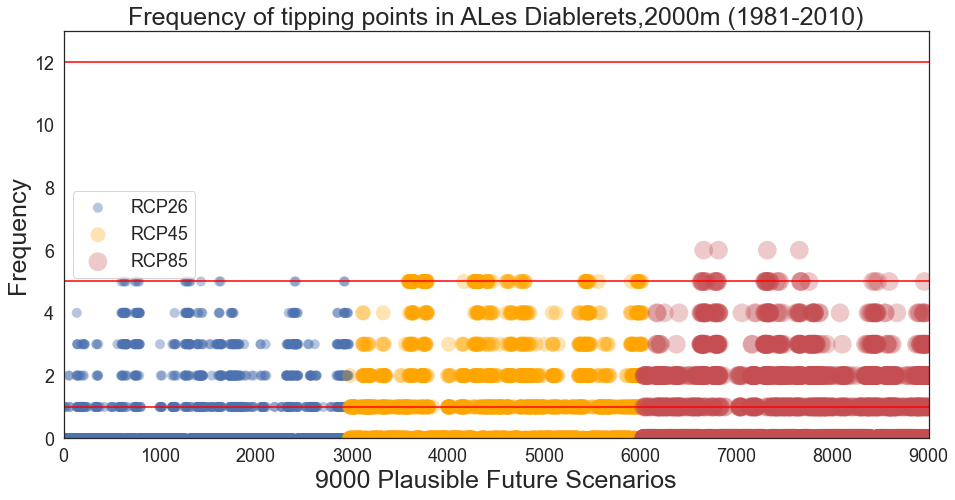

In [154]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [155]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [156]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [259]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [158]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    2195
1.0     300
3.0     189
2.0     184
4.0      82
5.0      21
Name: tippingPoint26_1980, dtype: int64
0.0    1867
1.0     551
2.0     285
3.0     140
5.0     112
4.0     106
Name: tippingPoint45_1980, dtype: int64
0.0    1838
2.0     450
1.0     399
3.0     152
4.0      93
5.0      35
6.0       4
Name: tippingPoint85_1980, dtype: int64


In [159]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    2194
1.0     300
3.0     189
2.0     184
4.0      82
5.0      21
Name: tippingPoint26_1_1980, dtype: int64
0.0    1866
1.0     551
2.0     285
3.0     140
5.0     112
4.0     106
Name: tippingPoint45_1_1980, dtype: int64
0.0    1837
2.0     450
1.0     399
3.0     152
4.0      93
5.0      35
6.0       4
Name: tippingPoint85_1_1980, dtype: int64


In [160]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario26_1980, dtype: int64
43    68
42    68
38    68
36    68
34    68
32    68
30    68
28    68
26    68
24    68
22    68
20    68
18    68
16    68
14    68
12    68
10    68
8     68
6     68
4     68
2     68
40    68
44    68
41    68
1     68
39    68
37    68
35    68
33    68
31    68
29    68
27    68
25    68
23    68
21    68
19    68
17    68
15    68
13    68
11    68
9     68
7     68
5     68
3     68
0     68
Name: scenario45_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
1

In [161]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

177    45
110    45
1      45
194    45
188    45
178    45
158    45
154    45
150    45
144    45
140    45
138    45
134    45
128    45
124    45
118    45
106    45
171    45
96     45
88     45
82     45
68     45
64     45
62     45
58     45
54     45
44     45
40     45
30     45
20     45
18     45
14     45
5      45
7      45
21     45
23     45
165    45
159    45
155    45
143    45
141    45
129    45
127    45
121    45
119    45
115    45
109    45
103    45
99     45
89     45
87     45
85     45
83     45
75     45
73     45
71     45
69     45
65     45
59     45
45     45
43     45
39     45
31     45
29     45
25     45
6      45
Name: policy26_1980, dtype: int64
197    45
130    45
84     45
94     45
100    45
108    45
116    45
122    45
132    45
185    45
152    45
160    45
162    45
170    45
174    45
182    45
72     45
70     45
66     45
60     45
56     45
52     45
50     45
46     45
36     45
34     45
32     45
26     45
24     45
22     45
10    

In [263]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

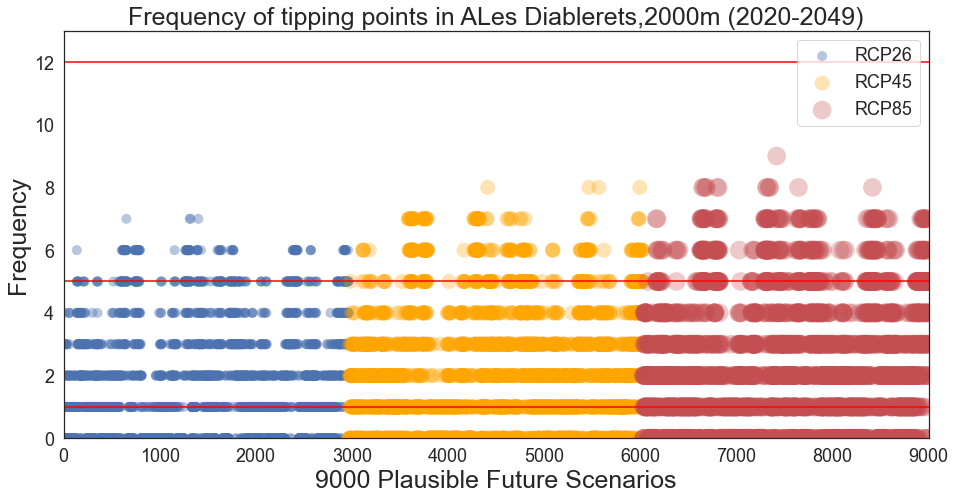

In [264]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [265]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [266]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [267]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

0.0    1038
2.0     539
1.0     531
3.0     327
5.0     247
4.0     184
6.0     101
7.0       4
Name: tippingPoint26_2020, dtype: int64
0.0    973
1.0    689
3.0    445
2.0    376
4.0    221
5.0    165
6.0    136
7.0     52
8.0      4
Name: tippingPoint45_2020, dtype: int64
0.0    829
2.0    548
1.0    498
3.0    379
4.0    242
5.0    234
6.0    142
7.0     86
8.0     12
9.0      1
Name: tippingPoint85_2020, dtype: int64


In [268]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

0.0    1037
2.0     539
1.0     531
3.0     327
4.0     184
Name: tippingPoint26_1_2020, dtype: int64
0.0    972
1.0    689
3.0    445
2.0    376
4.0    221
Name: tippingPoint45_1_2020, dtype: int64
0.0    828
2.0    548
1.0    498
3.0    379
4.0    242
Name: tippingPoint85_1_2020, dtype: int64


In [269]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

0     66
13    66
16    66
14    66
30    66
32    66
34    66
12    66
40    66
42    66
41    66
1     66
18    66
10    66
29    66
6     66
37    66
33    66
4     66
25    66
20    65
22    65
7     65
23    64
15    63
8     63
3     62
28    62
5     62
39    62
17    61
31    60
38    59
2     59
27    57
43    53
35    50
21    45
24    41
26    41
44    37
11    31
36    26
9     25
19    20
Name: scenario26_2020, dtype: int64
10    68
13    68
16    68
14    68
30    68
32    68
34    68
12    68
40    68
42    68
41    68
1     68
7     68
18    68
20    68
6     68
37    68
4     68
23    68
25    68
33    68
15    67
29    67
22    67
28    67
0     67
8     67
5     64
39    64
38    64
3     63
2     62
31    61
17    61
27    55
43    48
35    48
21    45
26    43
24    42
44    37
36    34
9     29
11    29
19    24
Name: scenario45_2020, dtype: int64
7     66
13    66
14    66
30    66
32    66
34    66
10    66
40    66
41    66
1     66
16    66
6     66
18    66
4

In [270]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

127    43
109    43
194    43
31     43
96     42
129    42
69     42
118    42
87     42
23     41
73     41
29     41
5      41
88     41
45     41
65     41
138    41
134    41
143    41
85     41
54     41
44     41
115    41
106    40
144    40
150    40
154    40
158    40
159    40
1      40
155    40
171    40
58     40
20     40
121    40
43     40
59     40
89     40
68     40
62     39
40     39
110    39
14     39
7      39
6      39
165    39
188    39
119    39
99     39
140    38
103    38
178    38
18     38
25     38
141    38
30     38
71     38
128    38
83     38
64     37
75     37
21     37
82     36
39     36
177    35
124    34
Name: policy26_2020, dtype: int64
77     43
179    43
67     43
192    42
183    42
24     42
34     42
52     42
116    42
132    42
174    42
17     42
47     42
60     41
122    41
130    41
197    41
147    41
137    40
27     40
160    40
84     40
170    40
135    40
182    40
184    40
70     40
56     40
167    40
33     40
50    

In [271]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

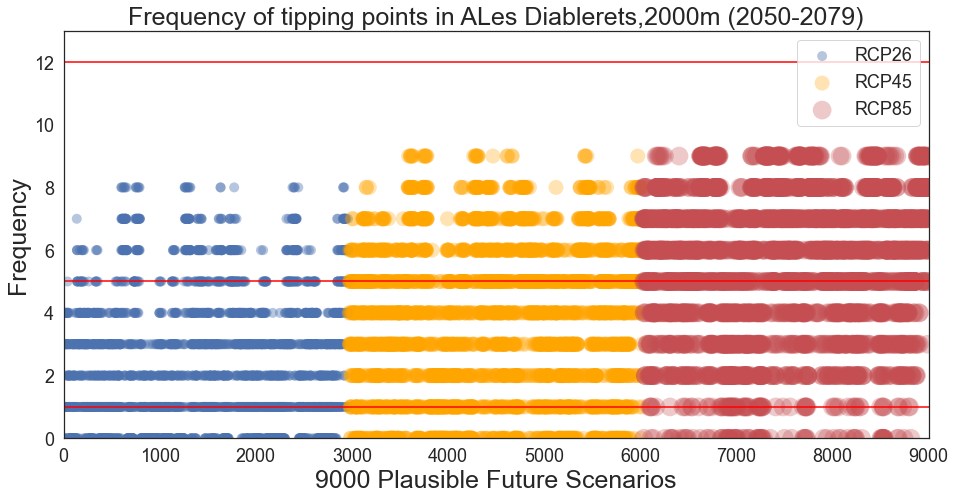

In [272]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [273]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [274]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [275]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

0.0    722
1.0    521
3.0    514
2.0    350
4.0    316
5.0    218
6.0    190
7.0    107
8.0     33
Name: tippingPoint26_2050, dtype: int64
5.0    433
0.0    411
3.0    382
1.0    373
6.0    364
4.0    352
2.0    315
7.0    271
8.0    128
9.0     32
Name: tippingPoint45_2050, dtype: int64
6.0    522
7.0    469
5.0    409
8.0    399
4.0    305
3.0    262
2.0    226
9.0    215
0.0     83
1.0     81
Name: tippingPoint85_2050, dtype: int64


In [276]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

0.0    721
1.0    521
3.0    514
2.0    350
4.0    316
Name: tippingPoint26_1_2050, dtype: int64
0.0    410
3.0    382
1.0    373
4.0    352
2.0    315
Name: tippingPoint45_1_2050, dtype: int64
4.0    305
3.0    262
2.0    226
0.0     82
1.0     81
Name: tippingPoint85_1_2050, dtype: int64


In [277]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

10    66
34    66
18    66
41    66
13    66
42    66
40    66
6     66
12    66
25    66
1     66
32    66
29    66
30    66
33    66
14    66
37    66
16    66
7     66
0     65
4     65
23    63
20    63
8     62
15    62
3     61
28    60
22    60
5     59
39    56
38    54
31    53
17    52
27    46
2     46
43    41
35    39
24    32
21    30
26    23
11    18
36    17
9     17
44    13
19    11
Name: scenario26_2050, dtype: int64
18    67
14    66
13    66
25    65
37    65
6     62
16    62
33    61
40    61
12    61
10    61
30    61
32    58
1     58
4     57
41    56
34    53
7     51
23    51
15    49
29    47
42    47
8     46
22    43
20    43
0     42
3     40
28    39
5     36
38    31
39    28
31    26
17    25
2     20
24    19
27    16
43    14
35    14
21    11
9     10
44    10
36    10
26    10
11     8
19     6
Name: scenario45_2050, dtype: int64
18    59
13    53
37    49
14    46
25    46
16    45
10    42
40    41
33    39
12    38
1     37
30    36
6     35
3

In [278]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

138    42
158    40
75     40
30     40
115    40
31     40
178    39
127    39
54     39
143    39
155    39
18     38
171    38
65     38
69     38
44     38
118    38
29     38
109    38
128    38
43     38
124    37
194    37
110    37
68     37
5      37
150    37
21     37
62     37
7      37
96     37
59     37
159    37
73     37
129    37
121    37
99     37
82     36
106    36
134    36
119    36
140    36
58     36
64     36
154    36
87     36
188    36
83     36
71     36
20     36
14     35
88     35
177    35
144    35
45     35
85     35
89     35
141    35
1      34
23     34
103    34
39     33
40     33
6      33
25     32
165    32
Name: policy26_2050, dtype: int64
72     32
162    32
15     30
56     30
192    30
183    30
133    30
67     30
11     29
145    29
66     29
152    29
61     29
52     29
51     29
170    29
47     29
46     29
179    29
34     29
182    29
27     29
105    28
84     28
33     28
108    28
26     28
122    28
181    28
132    27
135   

In [279]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

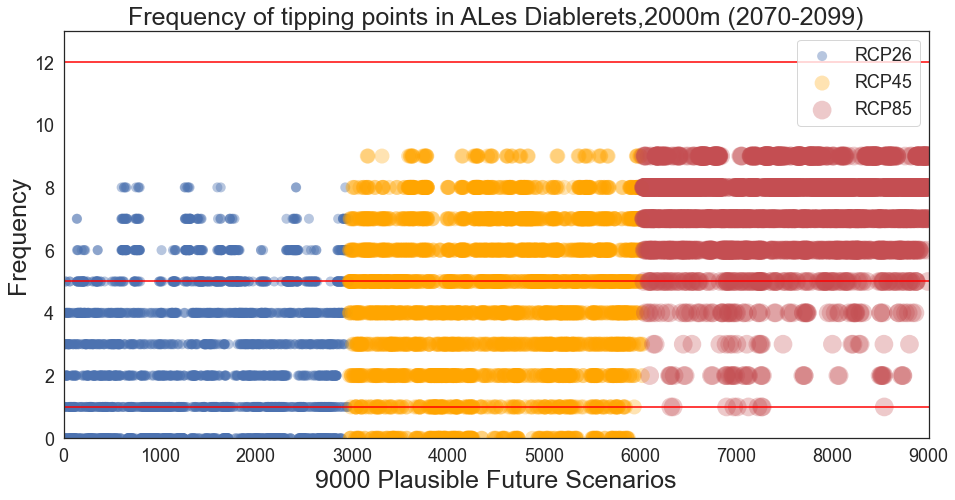

In [280]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [281]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [282]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [283]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

0.0    703
1.0    464
4.0    411
2.0    395
5.0    335
3.0    310
6.0    250
7.0     83
8.0     20
Name: tippingPoint26_2070, dtype: int64
5.0    435
6.0    410
7.0    396
4.0    393
2.0    337
3.0    301
8.0    266
0.0    251
1.0    211
9.0     61
Name: tippingPoint45_2070, dtype: int64
8.0    969
7.0    642
9.0    561
6.0    490
5.0    160
4.0     76
2.0     40
3.0     22
1.0     10
0.0      1
Name: tippingPoint85_2070, dtype: int64


In [284]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

0.0    702
1.0    464
4.0    411
2.0    395
3.0    310
Name: tippingPoint26_1_2070, dtype: int64
4.0    393
2.0    337
3.0    301
0.0    250
1.0    211
Name: tippingPoint45_1_2070, dtype: int64
4.0    76
2.0    40
3.0    22
1.0    10
Name: tippingPoint85_1_2070, dtype: int64


In [285]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

10    66
32    66
18    66
13    66
40    66
1     66
25    66
41    66
14    66
37    66
16    66
30    65
33    65
6     65
12    65
42    65
34    65
7     64
29    63
4     63
0     62
20    62
23    61
8     60
15    59
22    59
28    58
3     52
5     52
38    52
39    51
31    50
17    44
2     41
27    34
43    32
35    26
24    23
21    22
11    17
9     15
26    14
36    12
44    11
19     7
Name: scenario26_2070, dtype: int64
13    65
18    64
14    62
25    61
16    59
37    58
32    57
33    56
30    56
6     56
1     56
10    53
12    52
40    51
41    49
4     46
23    42
34    42
15    39
42    37
7     31
20    31
8     30
29    29
22    27
5     25
3     25
0     24
28    20
17    18
38    18
39    17
31    15
43    14
2     13
26    13
35    13
24    12
27    11
21     9
9      8
44     8
36     7
11     7
19     6
Name: scenario45_2070, dtype: int64
18    13
13    12
14    12
37    11
25    10
4      7
33     6
12     6
16     6
40     6
1      5
30     5
6      5
3

In [286]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

138    40
158    39
155    38
96     38
43     38
194    38
20     37
31     37
154    37
75     37
1      36
58     36
73     36
54     36
110    36
65     36
44     36
118    36
115    36
119    36
129    36
143    36
82     36
150    35
29     35
134    35
177    35
128    35
18     35
87     35
99     35
59     35
109    35
121    34
14     34
140    34
144    34
141    34
127    34
45     34
5      34
85     34
21     34
106    34
68     34
124    34
188    34
7      33
71     33
171    33
23     33
159    33
83     33
103    32
30     32
89     32
178    32
62     32
64     32
69     32
88     32
25     32
39     31
165    31
6      31
40     30
Name: policy26_2070, dtype: int64
133    28
72     27
179    27
26     27
185    26
183    26
15     26
152    25
105    25
56     25
100    25
162    25
11     25
27     24
145    24
17     24
36     24
167    24
170    24
70     24
116    23
77     23
66     23
32     23
51     23
108    23
122    23
22     23
131    23
34     23
24    

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [234]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [235]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [236]:
max_scenario.to_numpy()

array([99.80618182, 99.76633333, 99.83836   , 99.78842308, 99.89195   ,
       99.91118182, 99.8501    , 99.97384615, 98.96634615, 99.88463636,
       99.99567857, 98.64451724, 99.83117241, 99.794375  , 99.99875   ,
       99.675     , 99.79548276, 99.9725    , 99.99931034, 99.93723333,
       99.84351852, 99.82318182, 99.91417241, 99.60061538, 99.85352   ,
       99.85708333, 99.974125  , 99.99375862, 99.88164286, 99.98892   ,
       99.6975    , 99.98561538, 99.76657143, 99.94052   , 99.315     ,
       99.99768966, 99.5858    , 99.89651724, 99.91920833, 99.99675   ,
       99.84848148, 99.9695    , 99.54380769, 99.88277778, 99.97052   ,
       99.99328   , 99.25181818, 99.96356667, 99.84809091, 99.86536667,
       99.39548148, 99.81408333, 99.96569231, 99.88065517, 99.956375  ,
       99.78221429, 99.8815    , 99.97593333, 99.96783333, 99.91072727,
       99.878875  , 99.97903571, 99.96324   , 99.8057    , 99.8435    ,
       99.779     , 99.99240741, 99.5628    , 99.72808   , 99.85

In [237]:
min_scenario.to_numpy()

array([100.3776    , 100.171625  , 100.01211111, 100.23928571,
       100.04733333, 100.00316667, 100.3515    , 100.13978571,
       100.146     , 100.29325   , 100.01574074, 100.12617241,
       100.41772414, 100.00967857, 100.00225   , 100.35845455,
       100.064     , 100.20657692, 100.01058333, 100.29366667,
       100.19835   , 100.1362    , 100.0368    , 100.04279167,
       100.28768182, 100.47169231, 100.08916   , 100.12955556,
       100.14392857, 100.0258    , 101.68775862,  10.25831034,
       100.18864286, 100.12051724, 100.04154167, 100.00358621,
       100.12035714, 100.03524138, 100.10345   , 100.1425    ,
       100.05955556, 100.20276667, 100.23704167, 100.04824   ,
       100.130625  , 100.04235714, 100.1134    , 100.06256667,
       100.02718519, 100.50513333, 100.24144828, 100.00057143,
       100.02627273, 100.27246667, 100.12127273, 100.08557692,
       100.30575   , 100.0238    , 100.5325    ,  10.51243333,
       100.01444   , 100.05438462, 100.07992308, 100.04

In [238]:
max_scenario.shape

(118,)

## Changes in Good Days

In [239]:
max_scenario.to_numpy()

array([99.80618182, 99.76633333, 99.83836   , 99.78842308, 99.89195   ,
       99.91118182, 99.8501    , 99.97384615, 98.96634615, 99.88463636,
       99.99567857, 98.64451724, 99.83117241, 99.794375  , 99.99875   ,
       99.675     , 99.79548276, 99.9725    , 99.99931034, 99.93723333,
       99.84351852, 99.82318182, 99.91417241, 99.60061538, 99.85352   ,
       99.85708333, 99.974125  , 99.99375862, 99.88164286, 99.98892   ,
       99.6975    , 99.98561538, 99.76657143, 99.94052   , 99.315     ,
       99.99768966, 99.5858    , 99.89651724, 99.91920833, 99.99675   ,
       99.84848148, 99.9695    , 99.54380769, 99.88277778, 99.97052   ,
       99.99328   , 99.25181818, 99.96356667, 99.84809091, 99.86536667,
       99.39548148, 99.81408333, 99.96569231, 99.88065517, 99.956375  ,
       99.78221429, 99.8815    , 99.97593333, 99.96783333, 99.91072727,
       99.878875  , 99.97903571, 99.96324   , 99.8057    , 99.8435    ,
       99.779     , 99.99240741, 99.5628    , 99.72808   , 99.85

In [240]:
max_scenario.shape

(118,)

In [241]:
min_scenario.to_numpy()

array([100.3776    , 100.171625  , 100.01211111, 100.23928571,
       100.04733333, 100.00316667, 100.3515    , 100.13978571,
       100.146     , 100.29325   , 100.01574074, 100.12617241,
       100.41772414, 100.00967857, 100.00225   , 100.35845455,
       100.064     , 100.20657692, 100.01058333, 100.29366667,
       100.19835   , 100.1362    , 100.0368    , 100.04279167,
       100.28768182, 100.47169231, 100.08916   , 100.12955556,
       100.14392857, 100.0258    , 101.68775862,  10.25831034,
       100.18864286, 100.12051724, 100.04154167, 100.00358621,
       100.12035714, 100.03524138, 100.10345   , 100.1425    ,
       100.05955556, 100.20276667, 100.23704167, 100.04824   ,
       100.130625  , 100.04235714, 100.1134    , 100.06256667,
       100.02718519, 100.50513333, 100.24144828, 100.00057143,
       100.02627273, 100.27246667, 100.12127273, 100.08557692,
       100.30575   , 100.0238    , 100.5325    ,  10.51243333,
       100.01444   , 100.05438462, 100.07992308, 100.04

In [242]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [243]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =96.65 days
Uncertainty Band2 =96.65 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.65 days
Uncertainty Band2 =96.65 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.67 days
Uncertainty Band2 =96.67 days
****************************************End



In [244]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =95.17 days
Uncertainty Band2 =95.17 days
****************************************End

Start************************************************************
Uncertainty Band1 =92.19 days
Uncertainty Band2 =92.19 days
****************************************End

Start************************************************************
Uncertainty Band1 =93.69 days
Uncertainty Band2 =93.69 days
****************************************End



In [245]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =95.18 days
Uncertainty Band2 =95.17 days
****************************************End

Start************************************************************
Uncertainty Band1 =80.81 days
Uncertainty Band2 =80.81 days
****************************************End

Start************************************************************
Uncertainty Band1 =68.00 days
Uncertainty Band2 =68.12 days
****************************************End



In [246]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =87.74 days
Uncertainty Band2 =87.87 days
****************************************End

Start************************************************************
Uncertainty Band1 =71.12 days
Uncertainty Band2 =71.12 days
****************************************End

Start************************************************************
Uncertainty Band1 =51.71 days
Uncertainty Band2 =51.71 days
****************************************End



## Changes in Financial situation

In [247]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [248]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [249]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =4.88 days
Uncertainty Band2 =4.88 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.72 days
Uncertainty Band2 =4.72 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.84 days
Uncertainty Band2 =4.84 days
****************************************End



In [250]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =4.43 days
Uncertainty Band2 =4.44 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.36 days
Uncertainty Band2 =4.36 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.34 days
Uncertainty Band2 =4.33 days
****************************************End



In [251]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =4.20 days
Uncertainty Band2 =4.21 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.08 days
Uncertainty Band2 =4.08 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.69 days
Uncertainty Band2 =3.69 days
****************************************End



In [252]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.95 days
Uncertainty Band2 =3.95 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.70 days
Uncertainty Band2 =3.70 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.04 days
Uncertainty Band2 =3.04 days
****************************************End



## Changes in Artificial Snow

In [253]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [254]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =96.53 days
Uncertainty Band2 =96.53 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.59 days
Uncertainty Band2 =96.59 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.66 days
Uncertainty Band2 =96.67 days
****************************************End



In [255]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =96.70 days
Uncertainty Band2 =96.70 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.65 days
Uncertainty Band2 =96.65 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.55 days
Uncertainty Band2 =96.55 days
****************************************End



In [256]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =96.72 days
Uncertainty Band2 =96.72 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.97 days
Uncertainty Band2 =96.08 days
****************************************End

Start************************************************************
Uncertainty Band1 =76.99 days
Uncertainty Band2 =76.98 days
****************************************End



In [257]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =90.11 days
Uncertainty Band2 =90.11 days
****************************************End

Start************************************************************
Uncertainty Band1 =87.35 days
Uncertainty Band2 =87.35 days
****************************************End

Start************************************************************
Uncertainty Band1 =46.20 days
Uncertainty Band2 =46.20 days
****************************************End



## End